##ENGM4676 - Final Projet


**By: Carter Hiltz and Aethan Cubitt**

## PLEASE NOTE: Some model performance metrics, such as MAE and MSE, would change trial to trial. They may not match the exact performance metrics in the report, as the model has been run numerous times since.

### Load data and libraries

In [ ]:
# Import necessary libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import requests

from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler

from scipy.stats import pearsonr
from scipy.stats import mannwhitneyu
from scipy.stats import randint

from math import ceil

from xgboost import XGBRegressor

import seaborn as sns

import matplotlib.pyplot as plt

# mount google drive to the collab doc
from google.colab import drive
drive.mount('/content/drive')

# ignore any warnings that come from mounting drive
import warnings
warnings.filterwarnings('ignore')

Mounted at /content/drive


In [ ]:
# load IHME mortality dataset into Colab with the kaggle key
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d IHME/us-countylevel-mortality
!unzip -o us-countylevel-mortality.zip

# read the dataset into the pandas data frame
df1 = pd.read_csv('mort.csv')
df1 = df1.drop(0)
df1 = df1.dropna(subset=['FIPS'])
print(df1.head())


Dataset URL: https://www.kaggle.com/datasets/IHME/us-countylevel-mortality
License(s): other
 42% 5.00M/12.0M [00:00<00:00, 38.5MB/s]
100% 12.0M/12.0M [00:00<00:00, 62.3MB/s]
Archive:  us-countylevel-mortality.zip
  inflating: excel/excel/mort.XLSX   
  inflating: mort.csv                
                  Location    FIPS            Category  Mortality Rate, 1980*  \
1                  Alabama     1.0  Neonatal disorders                  11.03   
2  Autauga County, Alabama  1001.0  Neonatal disorders                   9.58   
3  Baldwin County, Alabama  1003.0  Neonatal disorders                   8.75   
4  Barbour County, Alabama  1005.0  Neonatal disorders                  12.30   
5     Bibb County, Alabama  1007.0  Neonatal disorders                  11.28   

   Mortality Rate, 1980* (Min)  Mortality Rate, 1980* (Max)  \
1                        10.57                        12.00   
2                         8.37                        11.02   
3                         7.86    

In [ ]:
# load EPA Superfund data set from downloaded drive location into colab
file_path = '/content/drive/My Drive/Superfund_Cleanup_Sites.xlsx'
df2 = pd.read_excel(file_path, skiprows = 4)
print(df2.head())

  Region State  \
0    NaN   NaN   
1   ‭01‬    CT   
2   ‭01‬    CT   
3   ‭01‬    CT   
4   ‭01‬    CT   

  Site Name                                                                  \
0                                                NaN                          
1                  BARKHAMSTED-NEW HARTFORD LANDFILL                          
2                            BEACON HEIGHTS LANDFILL                          
3                                     DURHAM MEADOWS                          
4                                    GALLUP'S QUARRY                          

     Site ID  Unnamed: 4        EPA ID               Address          City  \
0        NaN         NaN           NaN                   NaN           NaN   
1  ‭0100255‬         NaN  CTD980732333              ROUTE 44   BARKHAMSTED   
2  ‭0100180‬         NaN  CTD072122062  BLACKBERRY HILL ROAD  BEACON FALLS   
3  ‭0100108‬         NaN  CTD001452093               MAIN ST        DURHAM   
4  ‭0100201‬         NaN  

In [ ]:
# load Superfund data set from kaggle link into colab using kaggle key

# https://www.kaggle.com/datasets/thedevastator/epa-superfund-site-details

!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d thedevastator/epa-superfund-site-details
!unzip -o epa-superfund-site-details.zip

# Read the dataset into a pandas dataframe
df4 = pd.read_csv('Week 29 - EPA Superfund Sites.csv')
print(df4.head())

Dataset URL: https://www.kaggle.com/datasets/thedevastator/epa-superfund-site-details
License(s): other
  0% 0.00/216k [00:00<?, ?B/s]
100% 216k/216k [00:00<00:00, 75.9MB/s]
Archive:  epa-superfund-site-details.zip
  inflating: Week 29 - EPA Superfund Sites.csv  
  inflating: Week 29 - EPA Superfund Sites.hyper  
   index   Site EPA ID                                        Site Name  \
0      0  AL6210020008                    Alabama Army Ammunition Plant   
1      1  ALD004022448                    Alabama Plating Company, Inc.   
2      2  ALD981868466                                   American Brass   
3      3  AL3210020027  Anniston Army Depot (Southeast Industrial Area)   
4      4  ALD001221902                Ciba-Geigy Corp. (McIntosh Plant)   

           City      County    State Zip Code  EPA Region     Date Type  \
0  Childersburg   TALLADEGA  Alabama    35044           4  Listing Date   
1       Vincent      SHELBY  Alabama    35178           4  Listing Date   
2      He

In [ ]:
# load another Superfund data set from kaggle link into colab using kaggle key
# https://kaggle.com/datasets/srrobert50/federal-superfunds

!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d srrobert50/federal-superfunds
!unzip -o federal-superfunds.zip

# rread the csv data set into the colab data frame
df5 = pd.read_csv('pdb_block_group.csv')
print(df5.head())

Dataset URL: https://www.kaggle.com/datasets/srrobert50/federal-superfunds
License(s): CC0-1.0
 96% 295M/306M [00:02<00:00, 139MB/s]
100% 306M/306M [00:03<00:00, 105MB/s]
Archive:  federal-superfunds.zip
  inflating: pdb_block_group.csv     
  inflating: pdb_tract.csv           
  inflating: priorities_list_full.json  
   FIPS_Block_Group  State State_name  County     County_name  Tract  \
0       10010201001      1    Alabama       1  Autauga County  20100   
1       10010201002      1    Alabama       1  Autauga County  20100   
2       10010202001      1    Alabama       1  Autauga County  20200   
3       10010202002      1    Alabama       1  Autauga County  20200   
4       10010203001      1    Alabama       1  Autauga County  20300   

   Block_Group  Flag  LAND_AREA  AIAN_LAND  ...  \
0            1   NaN      1.638        0.0  ...   
1            2   NaN      2.150        0.0  ...   
2            1   NaN      0.795        0.0  ...   
3            2   NaN      0.495        0.0

## Preprocessing, cleaning, feature engineering



In [ ]:
# creates the get_fips_code function that can be called to return the FIPS code
#from the  US Census Bureau's API

def get_fips_code(lat, lon):

    base_url = "https://geocoding.geo.census.gov/geocoder/geographies/coordinates"  #US Census Bureu's API
    params = {
        "x": lon,
        "y": lat,
        "benchmark": "Public_AR_Current",
        "vintage": "Current_Current",
        "format": "json"
    }

    try:
        response = requests.get(base_url, params=params)
        response.raise_for_status()
        data = response.json()

        if "result" in data and "geographies" in data["result"]:  #checks for result in the returned data
            if "Counties" in data["result"]["geographies"]:
                county_info = data["result"]["geographies"]["Counties"][0]
                fips = county_info.get("GEOID")
                if fips:
                    print(f"Computed FIPS: {fips}")
                    return float(fips)  #FIPS  to float
        return float('nan')  # return NaN if no FIPS code is found
    except (requests.RequestException, ValueError) as e:
        print(f"Error while contacting the Census Bureau API or processing data: {e}")
        return float('nan')

# example of what function would do
"""
latitude = 41.849750
longitude = -72.447911
fips_code = get_fips_code(latitude, longitude)
print(f"FIPS Code: {fips_code}")
"""


'\nlatitude = 41.849750\nlongitude = -72.447911\nfips_code = get_fips_code(latitude, longitude)\nprint(f"FIPS Code: {fips_code}")\n'

### Convert EPA Superfund location coordinates into FIPS using API. Save new dataframe in OneDrive

In [ ]:
# drop irrelevant rows
df2 = df2.drop(0)
df2 = df2.drop(1341)

#cut rows with NaN in lat/lon collumns
df2['Latitude'] = df2['Latitude'].astype(str).str.strip().replace('', np.nan)
df2['Longitude'] = df2['Longitude'].astype(str).str.strip().replace('', np.nan)

# drop rows that done contain any data
df2.dropna(subset=['Latitude', 'Longitude'], inplace=True)

# convert to float and replace null values with NaN
df2['Latitude'] = pd.to_numeric(df2['Latitude'].str.replace(r'[^\d.-]', '', regex=True), errors='coerce')
df2['Longitude'] = pd.to_numeric(df2['Longitude'].str.replace(r'[^\d.-]', '', regex=True), errors='coerce')

# Convert each row of coordinates to FIPS and make a new column. This took about 15 mins.
df2['FIPS'] = df2.apply(lambda row: get_fips_code(row['Latitude'], row['Longitude']), axis=1)

# save the data frame to a CSV file in your google drive
df2.to_csv('/content/drive/MyDrive/superfund_fips_data.csv', index=False)


Computed FIPS: 09160
Computed FIPS: 09140
Computed FIPS: 09130
Computed FIPS: 09150
Computed FIPS: 09190
Computed FIPS: 09140
Computed FIPS: 09150
Computed FIPS: 09180
Computed FIPS: 09110
Computed FIPS: 09120
Computed FIPS: 09140
Computed FIPS: 09110
Computed FIPS: 09150
Computed FIPS: 25005
Computed FIPS: 25021
Computed FIPS: 25021
Computed FIPS: 25021
Computed FIPS: 25017
Computed FIPS: 25009
Computed FIPS: 25027
Computed FIPS: 25009
Computed FIPS: 25017
Computed FIPS: 25009
Computed FIPS: 25027
Computed FIPS: 25017
Computed FIPS: 25017
Computed FIPS: 25025
Computed FIPS: 25009
Computed FIPS: 25017
Computed FIPS: 25017
Computed FIPS: 25005
Computed FIPS: 25017
Computed FIPS: 25017
Computed FIPS: 25017
Computed FIPS: 25001
Computed FIPS: 25013
Computed FIPS: 25005


KeyboardInterrupt: 

In [ ]:
# Load FIPS-augmented EPA Superfund dataset
file_path = '/content/drive/My Drive/superfund_fips_data.csv'
df3 = pd.read_csv(file_path)
print(df3.head())

  Region State  \
0   ‭01‬    CT   
1   ‭01‬    CT   
2   ‭01‬    CT   
3   ‭01‬    CT   
4   ‭01‬    CT   

  Site Name                                                                  \
0                  BARKHAMSTED-NEW HARTFORD LANDFILL                          
1                            BEACON HEIGHTS LANDFILL                          
2                                     DURHAM MEADOWS                          
3                                    GALLUP'S QUARRY                          
4                         KELLOGG-DEERING WELL FIELD                          

     Site ID  Unnamed: 4        EPA ID                   Address  \
0  ‭0100255‬         NaN  CTD980732333                  ROUTE 44   
1  ‭0100180‬         NaN  CTD072122062      BLACKBERRY HILL ROAD   
2  ‭0100108‬         NaN  CTD001452093                   MAIN ST   
3  ‭0100201‬         NaN  CTD108960972                  ROUTE 12   
4  ‭0100252‬         NaN  CTD980670814  NORWALK WATER DEPARTMENT   

       

In [ ]:
# Printing unique values in the 'Category' column
print(df1['Category'].unique())

['Neonatal disorders' 'HIV/AIDS and tuberculosis'
 'Musculoskeletal disorders'
 'Diabetes, urogenital, blood, and endocrine diseases'
 'Digestive diseases' 'Chronic respiratory diseases'
 'Neurological disorders' 'Cirrhosis and other chronic liver diseases'
 'Mental and substance use disorders'
 'Forces of nature, war, and legal intervention' 'Unintentional injuries'
 'Nutritional deficiencies'
 'Other communicable, maternal, neonatal, and nutritional diseases'
 'Cardiovascular diseases'
 'Diarrhea, lower respiratory, and other common infectious diseases'
 'Maternal disorders' 'Other non-communicable diseases'
 'Self-harm and interpersonal violence' 'Neoplasms' 'Transport injuries'
 'Neglected tropical diseases and malaria']


In [ ]:
'''
This code creates new columns for each of the years where mortality rate is measured.
In these columns the number of Superfund sites per-county at the specified year is counted.
'''

# parse the NPL Status in df3 to get the year
df3['NPS Year'] = pd.to_datetime(df3['NPL Status']).dt.year

# pick the years we want to count sites for
years = [1980, 1985, 1990, 1995, 2000, 2005, 2010, 2014]

# initialize the new columns in df1 with zeros
for year in years:
    df1[f'Number of Sites in {year}'] = 0

# loop through each year and count the number of sites for each FIPS
for year in years:
    # Filter df3 for entries where NPS Year is less than or equal to the current year
    filtered_df3 = df3[df3['NPS Year'] <= year]

    # Count how mant times the FIPS data appears in the filtered data
    counts = filtered_df3['FIPS'].value_counts()

    # update corresponding column in df1
    for fips, count in counts.items():
        df1.loc[df1['FIPS'] == fips, f'Number of Sites in {year}'] = count

In [ ]:
#drop mortality categories that are not likely to be impacted by Superfund site exposure
filtered_df = df1[df1['Category'].isin(['Neonatal disorders', 'Musculoskeletal disorders', 'Diabetes, urogenital, blood, and endocrine diseases', 'Chronic respiratory diseases', 'Digestive diseases', 'Neurological disorders', 'Cirrhosis and other chronic liver diseases', 'Nutritional deficiencies', 'Other communicable, maternal, neonatal, and nutritional diseases', 'Cardiovascular diseases', 'Diarrhea, lower respiratory, and other common infectious diseases'])]

In [ ]:
'''
This example shows how the number of Superfund sites has been
tracked over the years in the "Number of Sites in (year)" columns.
The specified FIPS is known to currently have two Superfund sites,
the first opening in 1983, and the second in 1987
'''

columns_to_display = [
    f'Number of Sites in {year}' for year in [1980, 1985, 1990]   #columns to print
]

# Filter for row where FIPS = 30093
filtered_data = df1[(df1['FIPS'] == 30093) & (df1['Category'] == 'Cardiovascular diseases')][columns_to_display]

#print the contents of the columns to show the changes to the Superfund sites over the tracked years
print(filtered_data)


       Number of Sites in 1980  Number of Sites in 1985  \
43194                        0                        1   

       Number of Sites in 1990  
43194                        2  


In [ ]:
# sum up land area by county

# Filter df5 where "has_superfund" is not zero
filtered_df5 = df5[df5['has_superfund'] != 0]

#Create a merged FIPS column in df5 (State + zero-padded County) and convert the value to a integer.
filtered_df5['Concatenated_FIPS'] = (filtered_df5['State'].astype(str) +
                                     filtered_df5['County'].apply(lambda x: f'{x:03d}')).astype(int)

# add fips and leand area together in new data frame
land_area_sum = filtered_df5.groupby('Concatenated_FIPS')['LAND_AREA'].sum()


#ensure FIPS is an integer to match the FIPS inother frame
df1['FIPS'] = df1['FIPS'].astype(int)

# create a new data frame for summed land area so we dont have to modify df1
county_area_df = df1.copy()  # Create a new dataframe to hold the results
county_area_df['SUM_LAND_AREA'] = county_area_df['FIPS'].map(land_area_sum)

#show the new dataframe with summed land areas
print("\nNew DataFrame with SUM_LAND_AREA (county_area_df):")
print(county_area_df.head(10))  #
county_area_df.to_csv('/content/drive/MyDrive/output_test_1.csv', index=False)




New DataFrame with SUM_LAND_AREA (county_area_df):
                    Location  FIPS            Category  Mortality Rate, 1980*  \
1                    Alabama     1  Neonatal disorders                  11.03   
2    Autauga County, Alabama  1001  Neonatal disorders                   9.58   
3    Baldwin County, Alabama  1003  Neonatal disorders                   8.75   
4    Barbour County, Alabama  1005  Neonatal disorders                  12.30   
5       Bibb County, Alabama  1007  Neonatal disorders                  11.28   
6     Blount County, Alabama  1009  Neonatal disorders                   6.05   
7    Bullock County, Alabama  1011  Neonatal disorders                  16.01   
8     Butler County, Alabama  1013  Neonatal disorders                  11.62   
9    Calhoun County, Alabama  1015  Neonatal disorders                   9.31   
10  Chambers County, Alabama  1017  Neonatal disorders                  12.10   

    Mortality Rate, 1980* (Min)  Mortality Rate, 1980* (

In [ ]:
# SUM UP LAND AREA by state
# get the state code which is the first two of five integers
county_area_df['State_Code'] = county_area_df['FIPS'].apply(
    lambda x: int(str(x)[:1]) if x < 10000 else int(str(x)[:2])
)

# drop duplicate rows becuase we only want to consider the first occurence
unique_county_area_df = county_area_df.drop_duplicates(subset='FIPS', keep='first')

# group by state code and sum all the land area in each state
state_land_area_sum = unique_county_area_df.groupby('State_Code')['SUM_LAND_AREA'].sum()

#add new column to hold summed land area only in Rows where FIPS equals the state code
county_area_df['TOTAL_LAND_AREA'] = county_area_df['FIPS'].apply(
    lambda x: state_land_area_sum[x // 100] if x >= 10000 and (x // 100) in state_land_area_sum.index else (
        state_land_area_sum[x] if x in state_land_area_sum.index else float('nan'))
)

# create a new dataframe for state-level data
state_area_df = county_area_df.copy()

# update the LAND_AREA column for rows where FIPS matches the state code
# Only update rows where FIPS is a state code

state_area_df.loc[state_area_df['FIPS'].apply(lambda x: x < 10000), 'SUM_LAND_AREA'] = state_area_df['TOTAL_LAND_AREA']

#display the updated state_area_df
print("\nUpdated state_area_df with SUM_LAND_AREA:")
print(state_area_df.head(10))
state_area_df.to_csv('/content/drive/MyDrive/output_test_2.csv', index=False)





Updated state_area_df with SUM_LAND_AREA:
                    Location  FIPS            Category  Mortality Rate, 1980*  \
1                    Alabama     1  Neonatal disorders                  11.03   
2    Autauga County, Alabama  1001  Neonatal disorders                   9.58   
3    Baldwin County, Alabama  1003  Neonatal disorders                   8.75   
4    Barbour County, Alabama  1005  Neonatal disorders                  12.30   
5       Bibb County, Alabama  1007  Neonatal disorders                  11.28   
6     Blount County, Alabama  1009  Neonatal disorders                   6.05   
7    Bullock County, Alabama  1011  Neonatal disorders                  16.01   
8     Butler County, Alabama  1013  Neonatal disorders                  11.62   
9    Calhoun County, Alabama  1015  Neonatal disorders                   9.31   
10  Chambers County, Alabama  1017  Neonatal disorders                  12.10   

    Mortality Rate, 1980* (Min)  Mortality Rate, 1980* (Max)  \
1

In [ ]:
#merge the county and state level area sums
#create a new data frame identical to state_area_df
merged_area_df = state_area_df.copy()

#replace sum_land_area in new data frame with values from the state_area_df and county_area_df
merged_area_df['SUM_LAND_AREA'] = np.where(
    ~state_area_df['SUM_LAND_AREA'].isna(),  # if state_area_df has a non NaN value
    state_area_df['SUM_LAND_AREA'],          # use the value from state_area_df
    county_area_df['SUM_LAND_AREA']          # otherwise use the value from county_area_df
)

# show result
print("\nMerged DataFrame with combined SUM_LAND_AREA:")
print(merged_area_df.head(10))  # display results
merged_area_df.to_csv('/content/drive/MyDrive/output_test_3.csv', index=False)



Merged DataFrame with combined SUM_LAND_AREA:
                    Location  FIPS            Category  Mortality Rate, 1980*  \
1                    Alabama     1  Neonatal disorders                  11.03   
2    Autauga County, Alabama  1001  Neonatal disorders                   9.58   
3    Baldwin County, Alabama  1003  Neonatal disorders                   8.75   
4    Barbour County, Alabama  1005  Neonatal disorders                  12.30   
5       Bibb County, Alabama  1007  Neonatal disorders                  11.28   
6     Blount County, Alabama  1009  Neonatal disorders                   6.05   
7    Bullock County, Alabama  1011  Neonatal disorders                  16.01   
8     Butler County, Alabama  1013  Neonatal disorders                  11.62   
9    Calhoun County, Alabama  1015  Neonatal disorders                   9.31   
10  Chambers County, Alabama  1017  Neonatal disorders                  12.10   

    Mortality Rate, 1980* (Min)  Mortality Rate, 1980* (Max) 

In [ ]:
## sum # of sites at state level
# List of columns to process
years = [1980, 1985, 1990, 1995, 2000, 2005, 2010, 2014]  # list of columns to process
site_columns = [f"Number of Sites in {year}" for year in years]

#get the state code from the first 1 or 2 first digits of FIPS.
merged_area_df['State_Code'] = merged_area_df['FIPS'].apply(
    lambda x: int(str(x)[:1]) if x < 10000 else int(str(x)[:2])
)

#deduplicate rows by county to ensure unique counting

unique_county_df = merged_area_df.groupby('FIPS', as_index=False).first()

# initialize final_sum_df as a copy of merged_area_df
final_sum_df = merged_area_df.copy()

# process each site column and calculate state level sums
for column in site_columns:

    state_sites_sum = unique_county_df.groupby('State_Code')[column].sum()  #groups by state code ans sum values in current column

    # create a new column in final_sum_df to hold the summed values for the current column
    total_sites_column = f"TOTAL_SITES_{column.split()[-1]}"
    final_sum_df[total_sites_column] = final_sum_df['FIPS'].apply(
        lambda x: state_sites_sum[x // 100] if x >= 10000 and (x // 100) in state_sites_sum.index else (
            state_sites_sum[x] if x in state_sites_sum.index else float('nan'))
    )

    # update the column values ONLY for rows where FIPS = 1–56 which are state level rows
    is_state_level = final_sum_df['FIPS'].between(1, 56)
    final_sum_df.loc[is_state_level, column] = final_sum_df.loc[is_state_level, total_sites_column]

# verify the result by displaying the updated dataframe
print("\nUpdated final_sum_df with summed values for all years:")
print(final_sum_df.head(10))
final_sum_df.to_csv('/content/drive/MyDrive/output_test_4.csv', index=False)



Updated final_sum_df with summed values for all years:
                    Location  FIPS            Category  Mortality Rate, 1980*  \
1                    Alabama     1  Neonatal disorders                  11.03   
2    Autauga County, Alabama  1001  Neonatal disorders                   9.58   
3    Baldwin County, Alabama  1003  Neonatal disorders                   8.75   
4    Barbour County, Alabama  1005  Neonatal disorders                  12.30   
5       Bibb County, Alabama  1007  Neonatal disorders                  11.28   
6     Blount County, Alabama  1009  Neonatal disorders                   6.05   
7    Bullock County, Alabama  1011  Neonatal disorders                  16.01   
8     Butler County, Alabama  1013  Neonatal disorders                  11.62   
9    Calhoun County, Alabama  1015  Neonatal disorders                   9.31   
10  Chambers County, Alabama  1017  Neonatal disorders                  12.10   

    Mortality Rate, 1980* (Min)  Mortality Rate, 198

In [ ]:
print(final_sum_df[final_sum_df['FIPS'] == 33015])


                               Location   FIPS  \
1802   Rockingham County, New Hampshire  33015   
4996   Rockingham County, New Hampshire  33015   
8190   Rockingham County, New Hampshire  33015   
11384  Rockingham County, New Hampshire  33015   
14578  Rockingham County, New Hampshire  33015   
17772  Rockingham County, New Hampshire  33015   
20966  Rockingham County, New Hampshire  33015   
24160  Rockingham County, New Hampshire  33015   
27354  Rockingham County, New Hampshire  33015   
30548  Rockingham County, New Hampshire  33015   
33742  Rockingham County, New Hampshire  33015   
36936  Rockingham County, New Hampshire  33015   
40130  Rockingham County, New Hampshire  33015   
43324  Rockingham County, New Hampshire  33015   
46518  Rockingham County, New Hampshire  33015   
49712  Rockingham County, New Hampshire  33015   
52906  Rockingham County, New Hampshire  33015   
56100  Rockingham County, New Hampshire  33015   
59294  Rockingham County, New Hampshire  33015   


In [ ]:


#print out state fips data to count sites and observe land area

# generate the list of state FIPS codes 1 to56
state_fips = list(range(1, 57))

# Filter the rows where FIPS is between 1 and 56
state_rows = final_sum_df[final_sum_df['FIPS'].isin(state_fips)]

# Calculate the sum of "Number of Sites in 2014" and "SUM_LAND_AREA" for FIPS 1-56
total_sites = state_rows['Number of Sites in 2014'].sum()
total_land_area = state_rows['SUM_LAND_AREA'].sum()

# print all rows using a while loop
print("\nState-Level FIPS Data (FIPS 1-56):")

chunk_size = 10  # num of rows to print at a time
start = 0

# while loop to print chunks
while start < len(state_rows):
    chunk = state_rows.iloc[start:start + chunk_size]  # Get a chunk of rows
    print(chunk[['FIPS', 'Number of Sites in 2014', 'SUM_LAND_AREA']])

    # see if the current chunk contains FIPS 56
    if 56 in chunk['FIPS'].values:
        print("\nStopping...")
        break  # exit the loop after printing FIPS 56

    start += chunk_size
    if start < len(state_rows):
        input("\nPress Enter to see the next chunk...\n")  # Pause for user input




State-Level FIPS Data (FIPS 1-56):
     FIPS  Number of Sites in 2014  SUM_LAND_AREA
1       1                       12        245.761
69      2                        6       4883.909
99      4                        9        511.048
115     5                        9        379.127
191     6                       93       3745.142
250     8                       19       2548.493
315     9                        0         46.436
324    10                       12         37.018
328    11                        1          0.409
330    12                       51        310.547

Press Enter to see the next chunk...

      FIPS  Number of Sites in 2014  SUM_LAND_AREA
398     13                       16        116.201
558     15                        3         25.787
564     16                        6        557.440
609     17                       42        255.195
712     18                       34        107.712
805     19                       10         96.698
905     20        

In [ ]:
#dropped connecticut becasue of insufficient county level medical data
final_sum_df = final_sum_df[final_sum_df['Location'] != 'Connecticut']


In [ ]:
# merge df4 with df3 on the 'EPA ID' column to copy the 'FIPS' from df3 to df4
df4 = pd.merge(df4, df3[['EPA ID', 'FIPS']], on='EPA ID', how='left')


print(df4.head())  #print the first few rows to ensure the merge worked as expected

   index   Site EPA ID                                        Site Name  \
0      0  AL6210020008                    Alabama Army Ammunition Plant   
1      1  ALD004022448                    Alabama Plating Company, Inc.   
2      2  ALD981868466                                   American Brass   
3      3  AL3210020027  Anniston Army Depot (Southeast Industrial Area)   
4      4  ALD001221902                Ciba-Geigy Corp. (McIntosh Plant)   

           City      County    State Zip Code  EPA Region     Date Type  \
0  Childersburg   TALLADEGA  Alabama    35044           4  Listing Date   
1       Vincent      SHELBY  Alabama    35178           4  Listing Date   
2      Headland       HENRY  Alabama    36345           4  Listing Date   
3      Anniston     CALHOUN  Alabama    36253           4  Listing Date   
4      McIntosh  WASHINGTON  Alabama    36553           4  Listing Date   

        Date  Site Score Federal Facility Indicator        EPA ID NPL Status  \
0  7/22/1987      

In [ ]:
# Assuming df4 and final_sum_df are already defined and both have the column 'FIPS'

# group df4 by FIPS and sum Site Score for each FIPS
fips_site_score_sum = df4.groupby('FIPS')['Site Score'].sum().reset_index()

# merge the summed Site Score back into final_sum_df based by the FIPS column
final_sum_df = pd.merge(final_sum_df, fips_site_score_sum, on='FIPS', how='left', suffixes=('', '_sum'))

print(final_sum_df.head())  #print the first few rows to ensure the merge worked as expected


                  Location  FIPS            Category  Mortality Rate, 1980*  \
0                  Alabama     1  Neonatal disorders                  11.03   
1  Autauga County, Alabama  1001  Neonatal disorders                   9.58   
2  Baldwin County, Alabama  1003  Neonatal disorders                   8.75   
3  Barbour County, Alabama  1005  Neonatal disorders                  12.30   
4     Bibb County, Alabama  1007  Neonatal disorders                  11.28   

   Mortality Rate, 1980* (Min)  Mortality Rate, 1980* (Max)  \
0                        10.57                        12.00   
1                         8.37                        11.02   
2                         7.86                         9.81   
3                        10.64                        14.15   
4                         9.63                        13.14   

   Mortality Rate, 1985*  Mortality Rate, 1985* (Min)  \
0                   8.51                         8.25   
1                   7.50        

In [ ]:
# group by the State_Code and sum Site Score values directly from final_sum_df

state_scores_sum = final_sum_df.groupby('State_Code')['Site Score'].sum()

# create a new column in final_sum_df to hold the summed values for Site Score
final_sum_df['TOTAL_SITE_SCORE'] = final_sum_df['FIPS'].apply(
    lambda x: state_scores_sum[x // 100] if x >= 10000 and (x // 100) in state_scores_sum.index else (
        state_scores_sum[x] if x in state_scores_sum.index else float('nan'))
)


#update the site Score column ONLY for rows where FIPS = 1–56 (state-level rows)
is_state_level = final_sum_df['FIPS'].between(1, 56)
final_sum_df.loc[is_state_level, 'Site Score'] = final_sum_df.loc[is_state_level, 'TOTAL_SITE_SCORE']

# verify the result by displaying the updated data frame
print("\nUpdated final_sum_df with summed 'Site Score' values at the state level:")
print(final_sum_df.head(10))
final_sum_df.to_csv('/content/drive/MyDrive/output_site_score.csv', index=False)



Updated final_sum_df with summed 'Site Score' values at the state level:
                   Location  FIPS            Category  Mortality Rate, 1980*  \
0                   Alabama     1  Neonatal disorders                  11.03   
1   Autauga County, Alabama  1001  Neonatal disorders                   9.58   
2   Baldwin County, Alabama  1003  Neonatal disorders                   8.75   
3   Barbour County, Alabama  1005  Neonatal disorders                  12.30   
4      Bibb County, Alabama  1007  Neonatal disorders                  11.28   
5    Blount County, Alabama  1009  Neonatal disorders                   6.05   
6   Bullock County, Alabama  1011  Neonatal disorders                  16.01   
7    Butler County, Alabama  1013  Neonatal disorders                  11.62   
8   Calhoun County, Alabama  1015  Neonatal disorders                   9.31   
9  Chambers County, Alabama  1017  Neonatal disorders                  12.10   

   Mortality Rate, 1980* (Min)  Mortality Rat

In [ ]:
print(final_sum_df[final_sum_df['FIPS'] == 33015])

                               Location   FIPS  \
1800   Rockingham County, New Hampshire  33015   
4992   Rockingham County, New Hampshire  33015   
8184   Rockingham County, New Hampshire  33015   
11376  Rockingham County, New Hampshire  33015   
14568  Rockingham County, New Hampshire  33015   
17760  Rockingham County, New Hampshire  33015   
20952  Rockingham County, New Hampshire  33015   
24144  Rockingham County, New Hampshire  33015   
27336  Rockingham County, New Hampshire  33015   
30528  Rockingham County, New Hampshire  33015   
33720  Rockingham County, New Hampshire  33015   
36912  Rockingham County, New Hampshire  33015   
40104  Rockingham County, New Hampshire  33015   
43296  Rockingham County, New Hampshire  33015   
46488  Rockingham County, New Hampshire  33015   
49680  Rockingham County, New Hampshire  33015   
52872  Rockingham County, New Hampshire  33015   
56064  Rockingham County, New Hampshire  33015   
59256  Rockingham County, New Hampshire  33015   


In [ ]:
#replace NaN values in final_sum_df with 0
final_sum_df = final_sum_df.fillna(0)

In [ ]:
# print to csv to verify the formatting and integrity of our data
final_sum_df.to_csv('/content/drive/MyDrive/output_test.csv', index=False)

###Exploratory Data Analysis

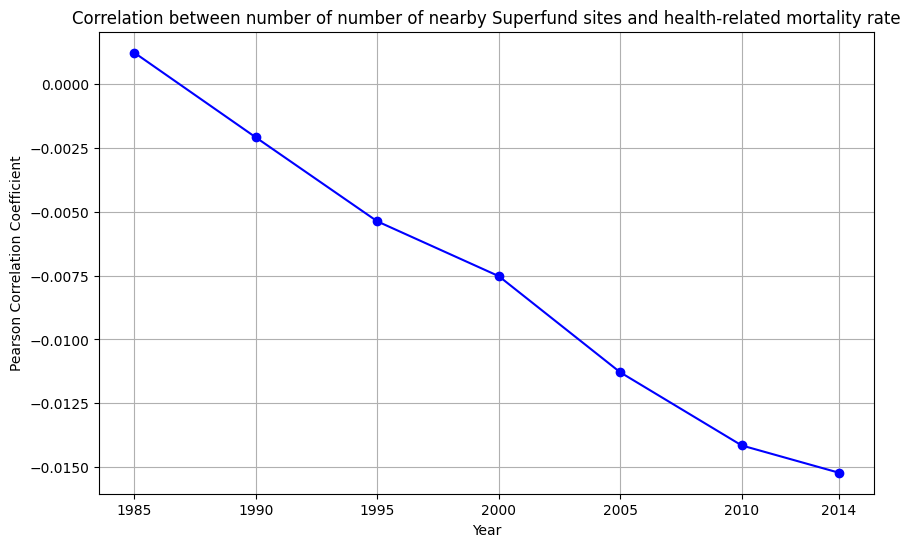

In [ ]:
# list of years we want to compute the correlation for
years = [1985, 1990, 1995, 2000, 2005, 2010, 2014]

# List to store the correlation coefficients for each year
correlation_coefficients = []

# Loop through the years and compute the Pearson correlation coefficient

for year in years:

    # Define the column names for "Number of Sites" and "Mortality Rate" directly
    sites_column = f'Number of Sites in {year}'
    mortality_column = f'Mortality Rate, {year}*'

    # Extract the columns for the year. nomalize X and Y
    x = (filtered_df[sites_column])
    y = (filtered_df[mortality_column])



    # compute the pearson correlation coefficient
    corr_coefficient, _ = pearsonr(x, y)

    #add the result to the end of the list
    correlation_coefficients.append(corr_coefficient)

# Plotting the Pearson correlation coefficients
plt.figure(figsize=(10, 6))
plt.plot(years, correlation_coefficients, marker='o', linestyle='-', color='b')

# added labels and title
plt.title('Correlation between number of number of nearby Superfund sites and health-related mortality rate')
plt.xlabel('Year')
plt.ylabel('Pearson Correlation Coefficient')

# print plot
plt.grid(True)
plt.xticks(years)
plt.show()



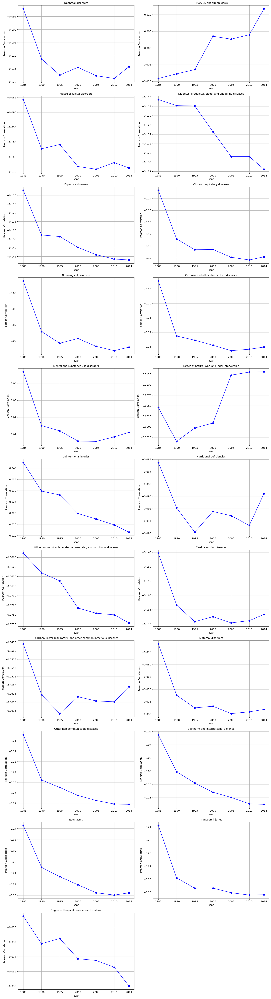

In [ ]:
# List of years we want to compute the correlation for
years = [1985, 1990, 1995, 2000, 2005, 2010, 2014]

# List of categories to filter by
categories_of_interest = [
    'Neonatal disorders',
    'HIV/AIDS and tuberculosis',
    'Musculoskeletal disorders',
    'Diabetes, urogenital, blood, and endocrine diseases',
    'Digestive diseases',
    'Chronic respiratory diseases',
    'Neurological disorders',
    'Cirrhosis and other chronic liver diseases',
    'Mental and substance use disorders',
    'Forces of nature, war, and legal intervention',
    'Unintentional injuries',
    'Nutritional deficiencies',
    'Other communicable, maternal, neonatal, and nutritional diseases',
    'Cardiovascular diseases',
    'Diarrhea, lower respiratory, and other common infectious diseases',
    'Maternal disorders',
    'Other non-communicable diseases',
    'Self-harm and interpersonal violence',
    'Neoplasms',
    'Transport injuries',
    'Neglected tropical diseases and malaria'
]

# Number of columns for the subplot grid
columns = 2
rows = ceil(len(categories_of_interest) / columns)

# Create a figure with subplots
fig, axes = plt.subplots(rows, columns, figsize=(15, rows * 5))
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Loop through the categories and create a plot for each one
for idx, category in enumerate(categories_of_interest):
    # Filter the dataframe by the current category
    filtered_by_category = df1[df1['Category'] == category]

    # List to store the correlation coefficients for the current category
    correlation_coefficients = []

    # Loop through the years and compute the Pearson correlation coefficient for the filtered category
    for year in years:
        # Define the column names for number of sites and mortality rate
        sites_column = f'Number of Sites in {year}'
        mortality_column = f'% Change in Mortality Rate, 1980-2014'

        # Extract the columns for the year in the filtered data
        x = filtered_by_category[sites_column]
        y = filtered_by_category[mortality_column]

        # Compute the Pearson correlation coefficient
        if len(x.dropna()) > 1 and len(y.dropna()) > 1:  # Ensure enough data points
            corr_coefficient, _ = pearsonr(x, y)
        else:
            corr_coefficient = None  # Handle cases where correlation can't be computed

        # Add the result to the list
        correlation_coefficients.append(corr_coefficient)

    # Plot the Pearson correlation coefficients for the current category
    ax = axes[idx]
    ax.plot(years, correlation_coefficients, marker='o', linestyle='-', color='b')
    ax.set_title(f'{category}', fontsize=10)
    ax.set_xlabel('Year')
    ax.set_ylabel('Pearson Correlation')
    ax.grid(True)
    ax.set_xticks(years)

# Turn off unused subplots
for idx in range(len(categories_of_interest), len(axes)):
    fig.delaxes(axes[idx])

# Adjust layout to prevent overlap
fig.tight_layout()

# Show the complete plot
plt.show()


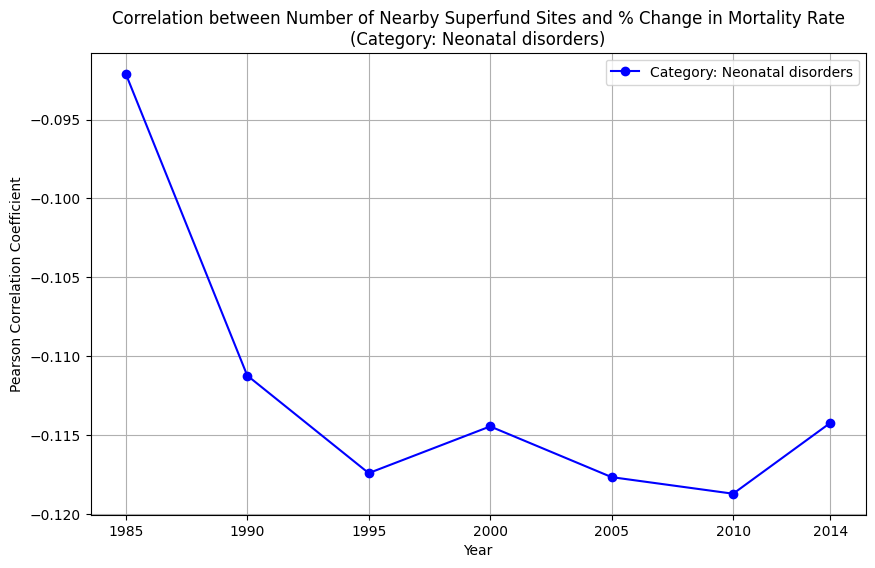

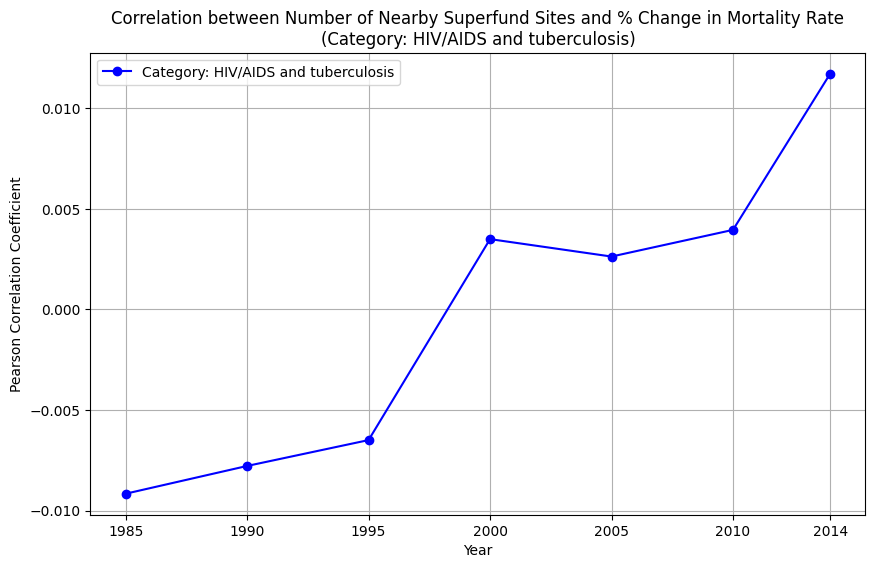

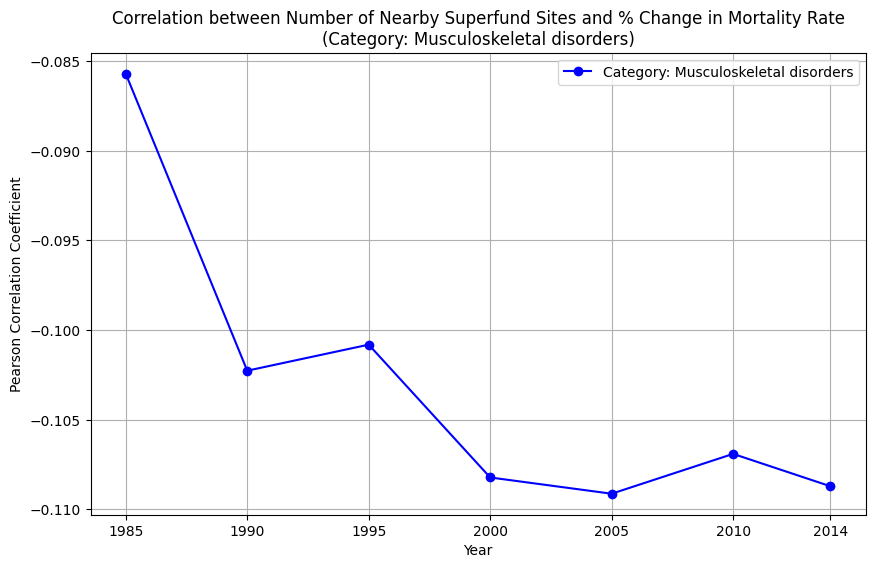

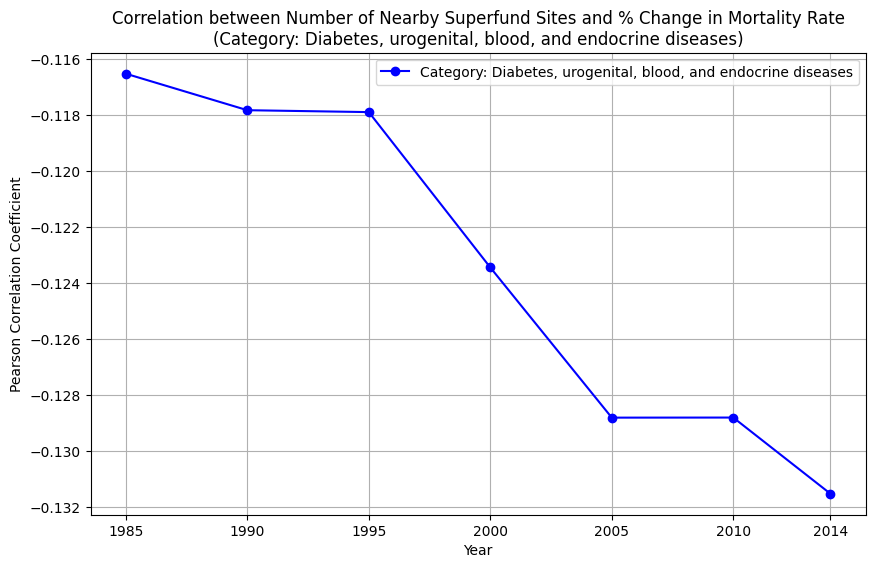

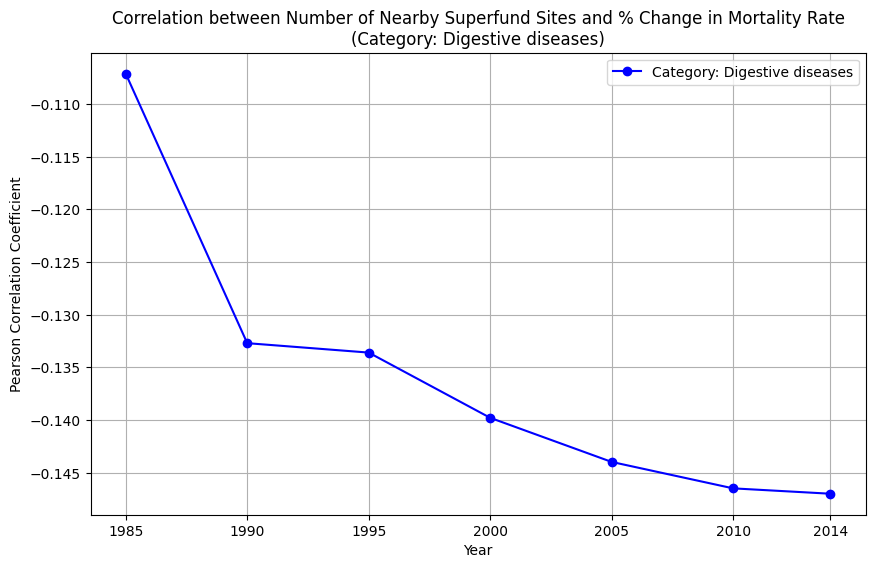

...

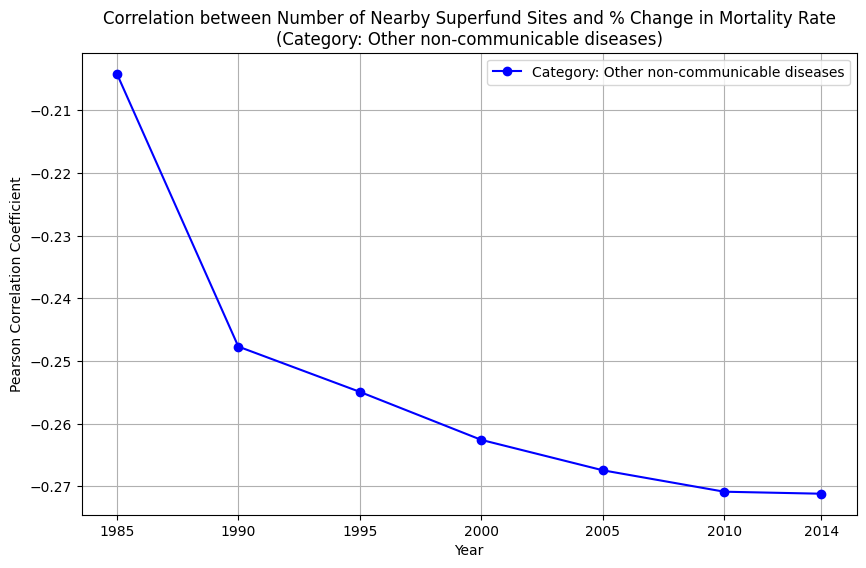

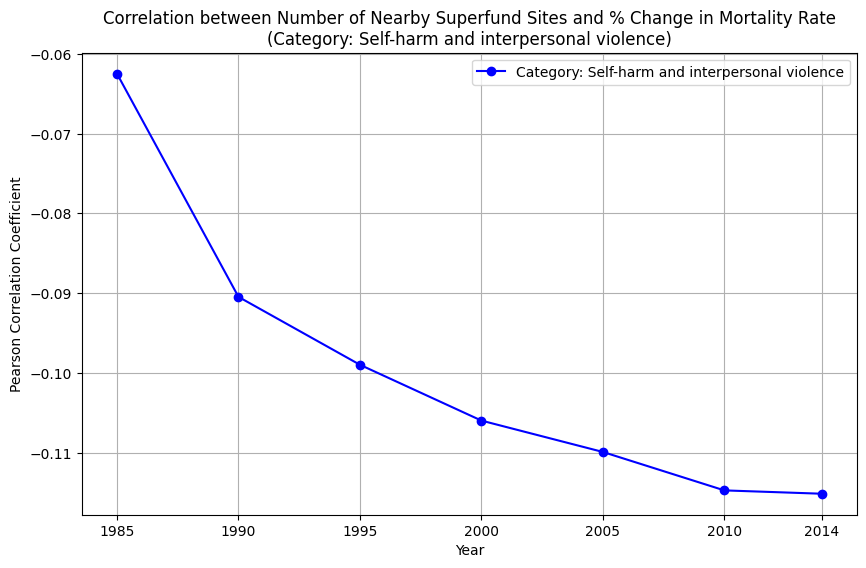

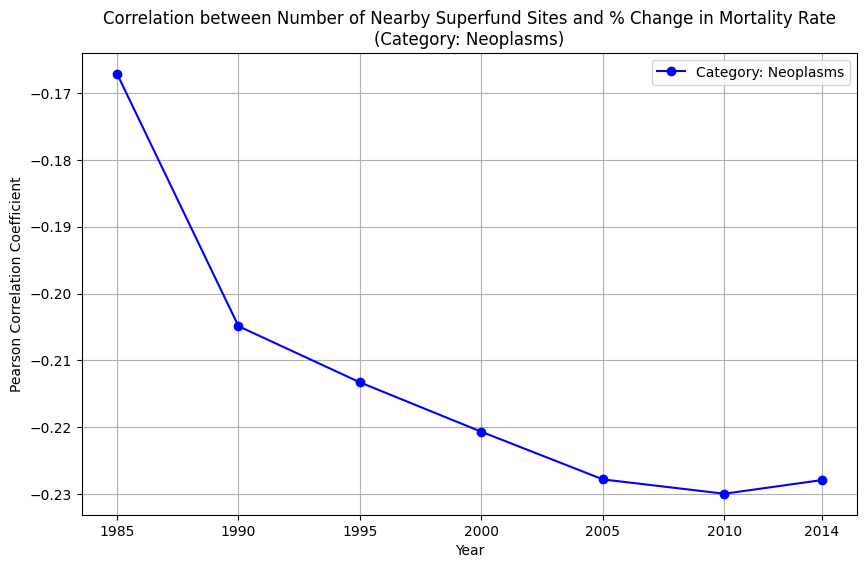

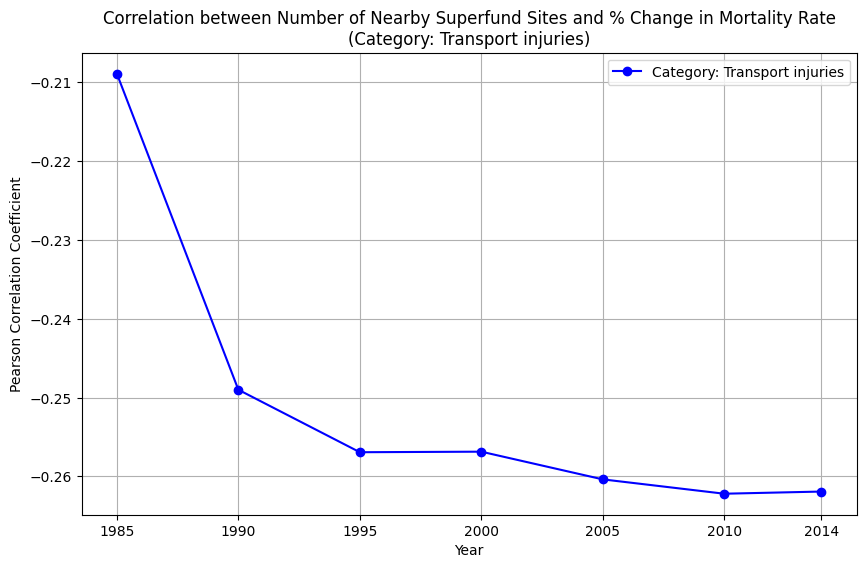

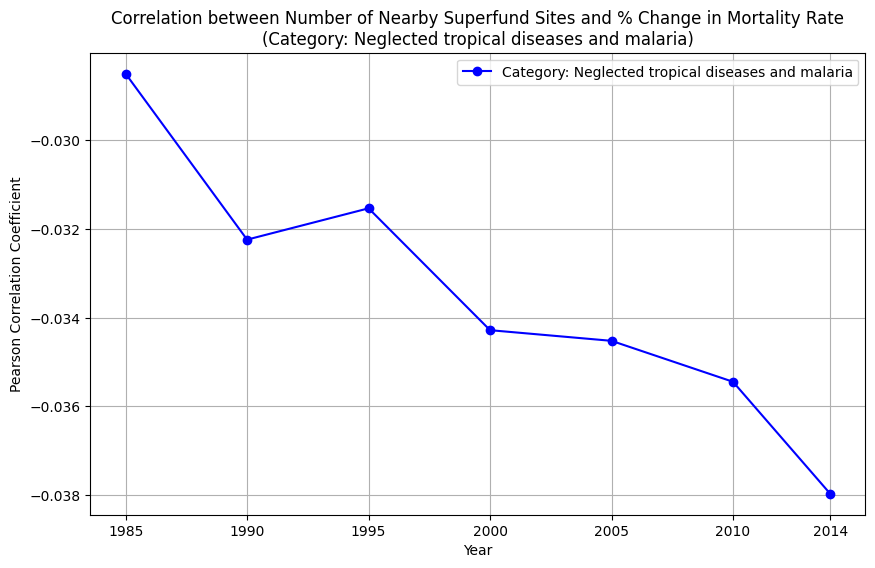

In [ ]:
# list of years we want to compute the correlation for
years = [1985, 1990, 1995, 2000, 2005, 2010, 2014]

# list of categories to filter by
categories_of_interest = [
  'Neonatal disorders',
  'HIV/AIDS and tuberculosis',
  'Musculoskeletal disorders',
  'Diabetes, urogenital, blood, and endocrine diseases',
  'Digestive diseases',
  'Chronic respiratory diseases',
  'Neurological disorders',
  'Cirrhosis and other chronic liver diseases',
  'Mental and substance use disorders',
  'Forces of nature, war, and legal intervention',
  'Unintentional injuries',
  'Nutritional deficiencies',
  'Other communicable, maternal, neonatal, and nutritional diseases',
  'Cardiovascular diseases',
  'Diarrhea, lower respiratory, and other common infectious diseases',
  'Maternal disorders',
  'Other non-communicable diseases',
  'Self-harm and interpersonal violence',
  'Neoplasms',
  'Transport injuries',
  'Neglected tropical diseases and malaria'
]

# loop through the categories and create a plot for each one
for category in categories_of_interest:
    # filter the dataframe by the current category
    filtered_by_category = df1[df1['Category'] == category]

    # list to store the correlation coefficients for the current category
    correlation_coefficients = []

    # loop through the years and compute the pearson correlation coefficient for the filtered category
    for year in years:

        # define the column names for number of sites and mortality rate
        sites_column = f'Number of Sites in {year}'
        mortality_column = f'% Change in Mortality Rate, 1980-2014'

        # extract the columns for the year in the filtered data
        x = filtered_by_category[sites_column]
        y = filtered_by_category[mortality_column]

        # compute the pearson correlation coefficient
        if len(x.dropna()) > 1 and len(y.dropna()) > 1:  # ensure enough data points
            corr_coefficient, _ = pearsonr(x, y)
        else:
            corr_coefficient = None  # haandle cases where correlation cant be computed

        # add the result to the end of the list
        correlation_coefficients.append(corr_coefficient)

    # plotting the pearson correlation coefficients for the current category
    plt.figure(figsize=(10, 6))
    plt.plot(years, correlation_coefficients, marker='o', linestyle='-', color='b', label=f'Category: {category}')

    # Add labels and title
    plt.title(f'Correlation between Number of Nearby Superfund Sites and % Change in Mortality Rate\n(Category: {category})')
    plt.xlabel('Year')
    plt.ylabel('Pearson Correlation Coefficient')
    plt.legend()

    # print he plot
    plt.grid(True)
    plt.xticks(years)
    plt.show()


Let's extend our analysis to the state-level.

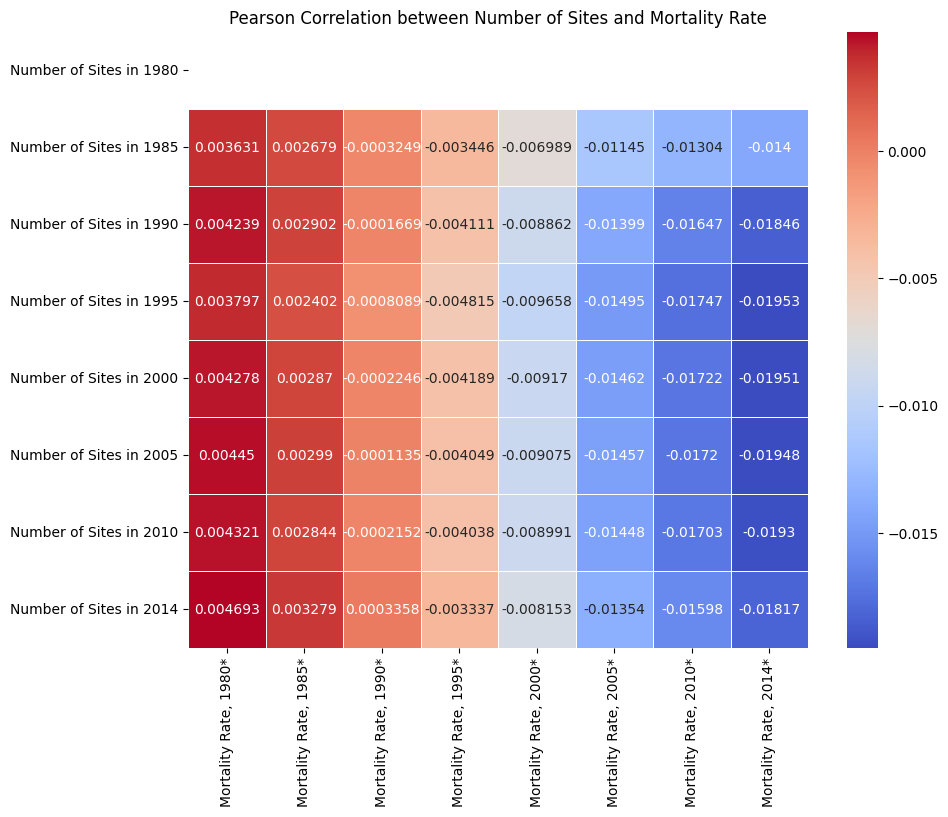

In [ ]:

#pearson corrleation at state level
# filter rows where FIPS is between 1 and 56
filtered_df = final_sum_df[(final_sum_df['FIPS'] >= 1) & (final_sum_df['FIPS'] <= 56)]

# define the years of interest
years = [1980, 1985, 1990, 1995, 2000, 2005, 2010, 2014]

# generate the column names for Number of Sites" and "Mortality Rate for each year
sites_columns = [f"Number of Sites in {year}" for year in years]
mortality_columns = [f"Mortality Rate, {year}*" for year in years]

# combine the two lists of columns
columns_to_correlate = sites_columns + mortality_columns

# select only the relevant columns
df_to_correlate = filtered_df[columns_to_correlate]

# calculate the pearson correlation matrix
correlation_matrix = df_to_correlate.corr()

# To evaluate the correlation between the Number of Sites at the State Level and Statewide Mortality Rate columns
correlation_sites_mortality = correlation_matrix.loc[sites_columns, mortality_columns]

# plot the correlation matrix
plt.figure(figsize=(10, 8))  # Set the figure size
sns.heatmap(correlation_sites_mortality, annot=True, cmap='coolwarm', fmt='.4g', linewidths=0.5)
plt.title('Pearson Correlation between Number of Sites and Mortality Rate')
plt.show()



In [ ]:
# Mann-Whitney U test for mortality rates at a county-level
#choose years we want included
years = [1985,1990,1995,2000,2005,2010,2014]

print(f"The following test measures whether there is a statistically significant difference")
print(f"between the mortality rates of counties with and without superfund sites\n")
for year in years:

  group_with_sites = df1[df1[f'Number of Sites in {year}'] != 0][ f'Mortality Rate, {year}*']
  group_without_sites = df1[df1[f'Number of Sites in {year}'] == 0][ f'Mortality Rate, {year}*']

  # preform mann-whitney U test
  stat, p_value = mannwhitneyu(group_with_sites, group_without_sites, alternative='two-sided')
  print(f"Results of Mann-Whitney U Test for {year}")
  print(f"U Statistic: {stat}")
  print(f"P-Value: {p_value}")
  if p_value < 0.05:
    print(f"The groups are significantly different.\n")
  else:
    print(f"The groups are not significantly different.\n")



The following test measures whether there is a statistically significant difference
between the mortality rates of counties with and without superfund sites

Results of Mann-Whitney U Test for 1985
U Statistic: 138541423.5
P-Value: 0.035706688201160464
The groups are significantly different.

Results of Mann-Whitney U Test for 1990
U Statistic: 254862758.0
P-Value: 0.0030467154799346703
The groups are significantly different.

Results of Mann-Whitney U Test for 1995
U Statistic: 274206454.5
P-Value: 0.0006960028327768439
The groups are significantly different.

Results of Mann-Whitney U Test for 2000
U Statistic: 295481799.0
P-Value: 0.001707454752593941
The groups are significantly different.

Results of Mann-Whitney U Test for 2005
U Statistic: 308623300.5
P-Value: 0.0001093056706476687
The groups are significantly different.

Results of Mann-Whitney U Test for 2010
U Statistic: 321953459.0
P-Value: 2.1007563589458465e-05
The groups are significantly different.

Results of Mann-Whitn

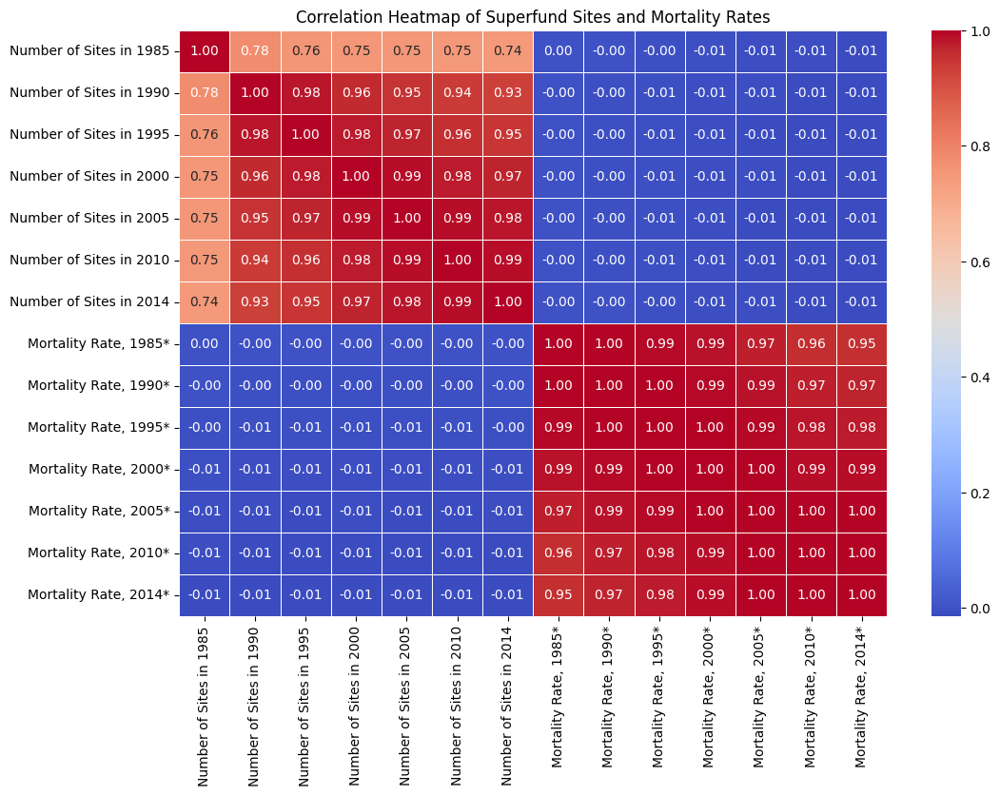

In [ ]:
# Select the columns we want to include
columns = ['Number of Sites in 1985', 'Number of Sites in 1990', 'Number of Sites in 1995',
           'Number of Sites in 2000', 'Number of Sites in 2005', 'Number of Sites in 2010',
           'Number of Sites in 2014', 'Mortality Rate, 1985*', 'Mortality Rate, 1990*',
           'Mortality Rate, 1995*', 'Mortality Rate, 2000*', 'Mortality Rate, 2005*',
           'Mortality Rate, 2010*', 'Mortality Rate, 2014*']

# create a subset of the dataframe with the selected columns
df_subset = df1[columns]

# calculate  correlation matrix
correlation_matrix = df_subset.corr()

# Create heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Superfund Sites and Mortality Rates')
plt.show()

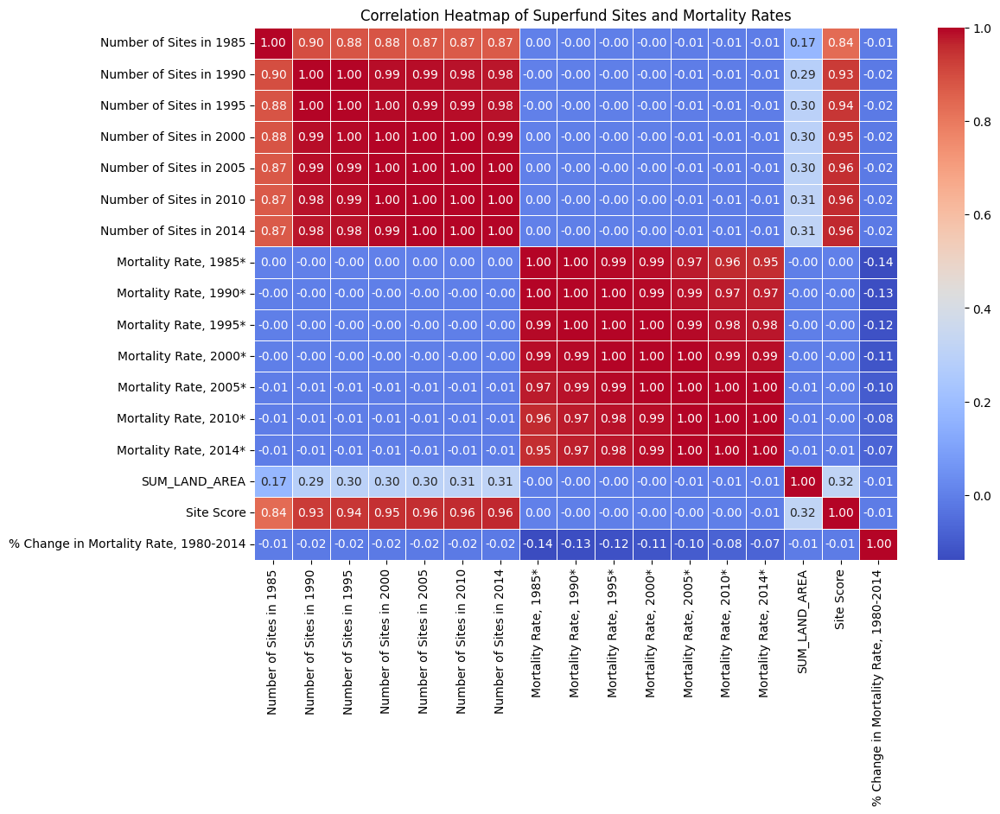

In [ ]:
# select the columns you want to include in the correlation matrix
columns = ['Number of Sites in 1985', 'Number of Sites in 1990', 'Number of Sites in 1995',
           'Number of Sites in 2000', 'Number of Sites in 2005', 'Number of Sites in 2010',
           'Number of Sites in 2014', 'Mortality Rate, 1985*', 'Mortality Rate, 1990*',
           'Mortality Rate, 1995*', 'Mortality Rate, 2000*', 'Mortality Rate, 2005*',
           'Mortality Rate, 2010*', 'Mortality Rate, 2014*', 'SUM_LAND_AREA', 'Site Score',
           '% Change in Mortality Rate, 1980-2014']

# create a subset of the dataframe with the selected columns
df_subset = final_sum_df[columns]

# calculate correlation matrix
correlation_matrix = df_subset.corr()

# Create tje heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Superfund Sites and Mortality Rates')
plt.show()

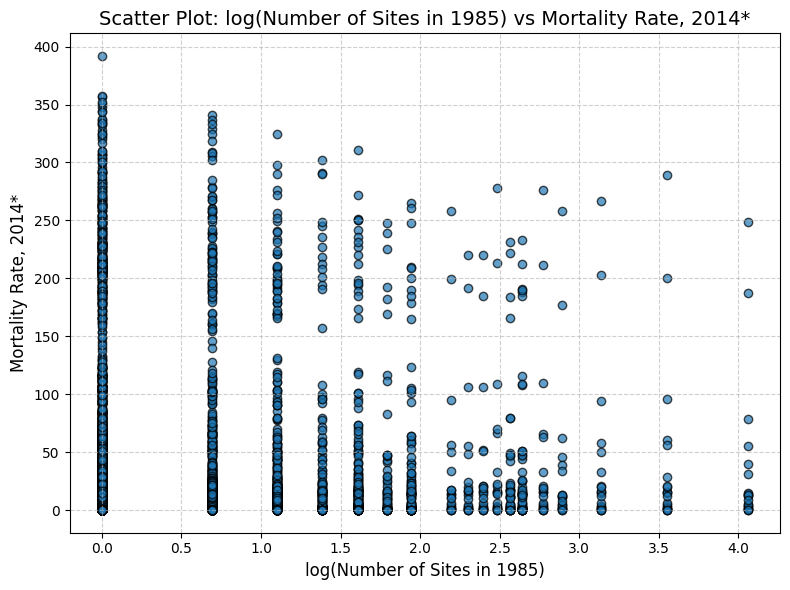

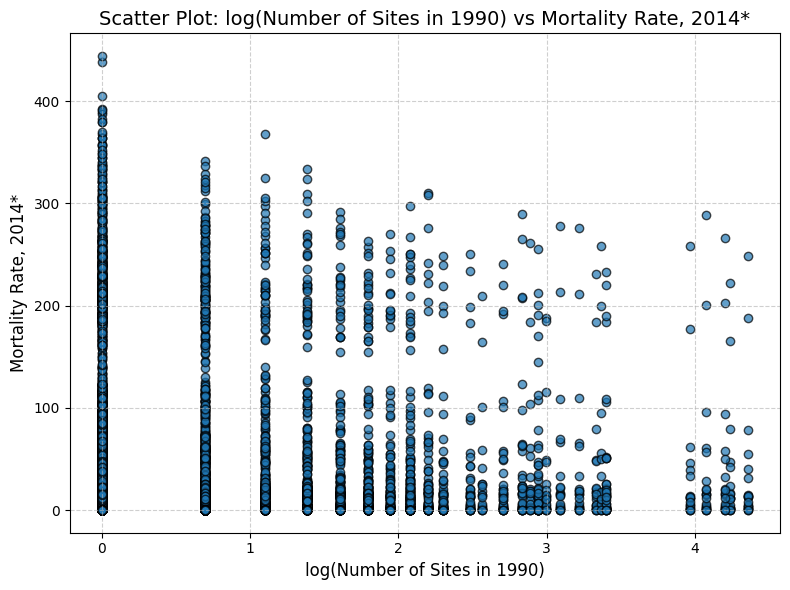

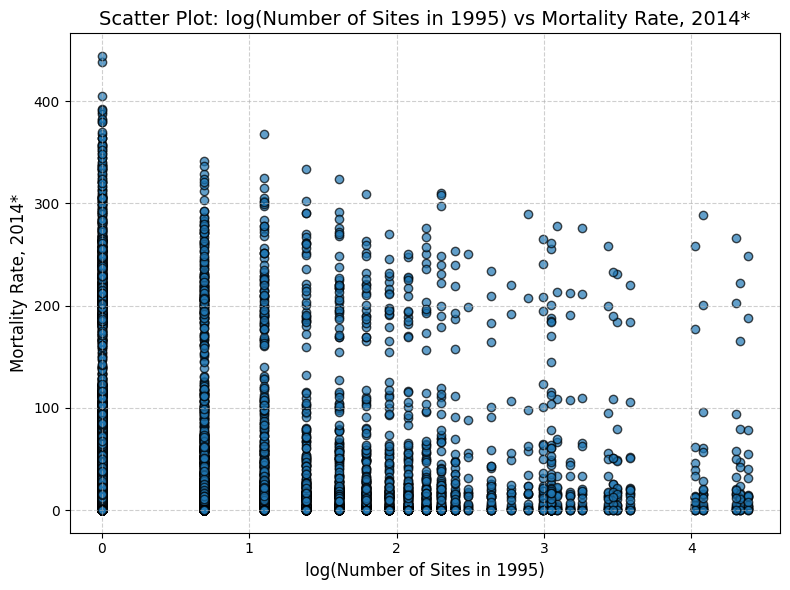

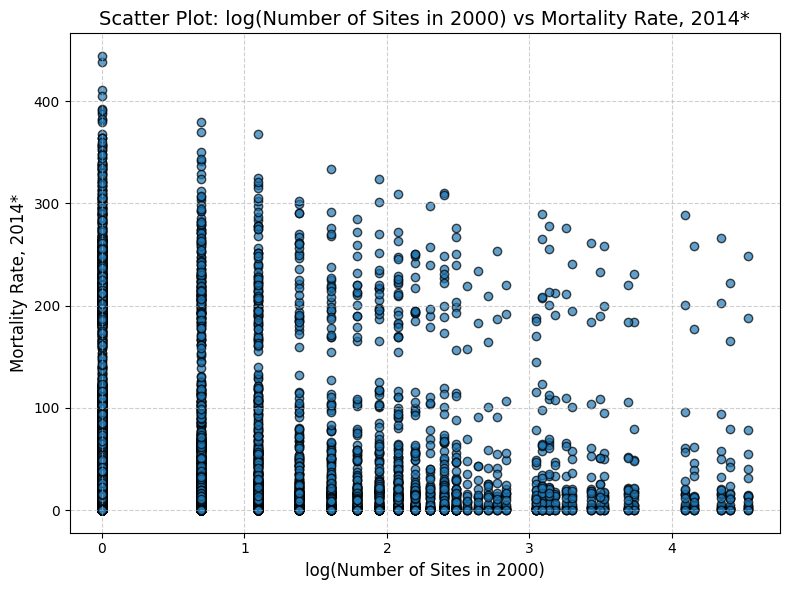

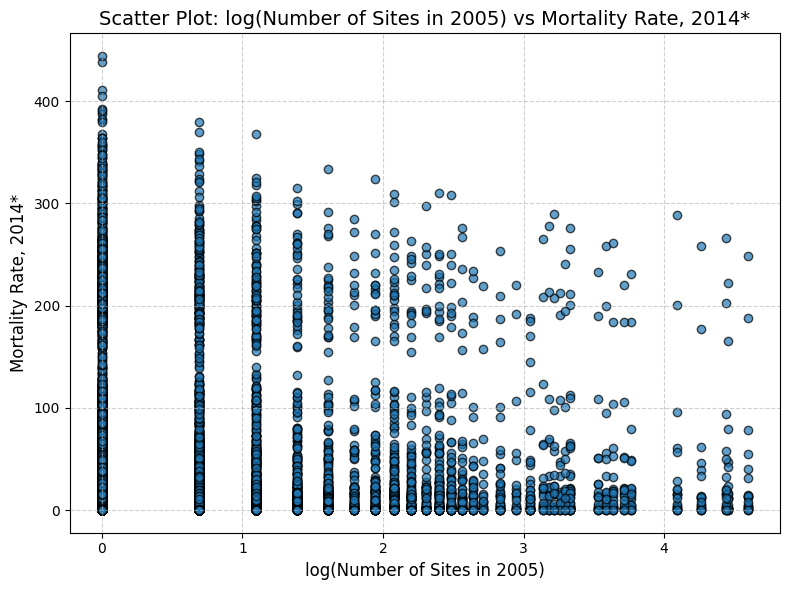

...

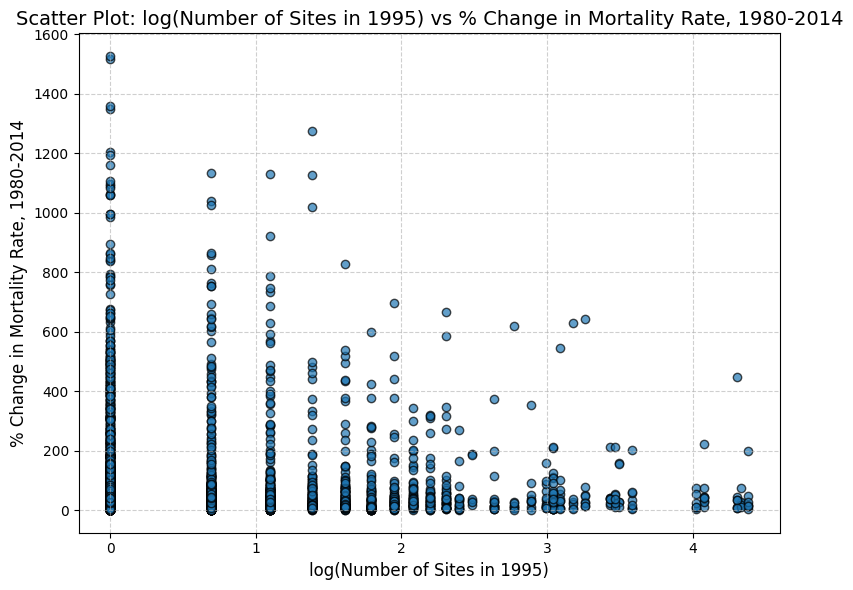

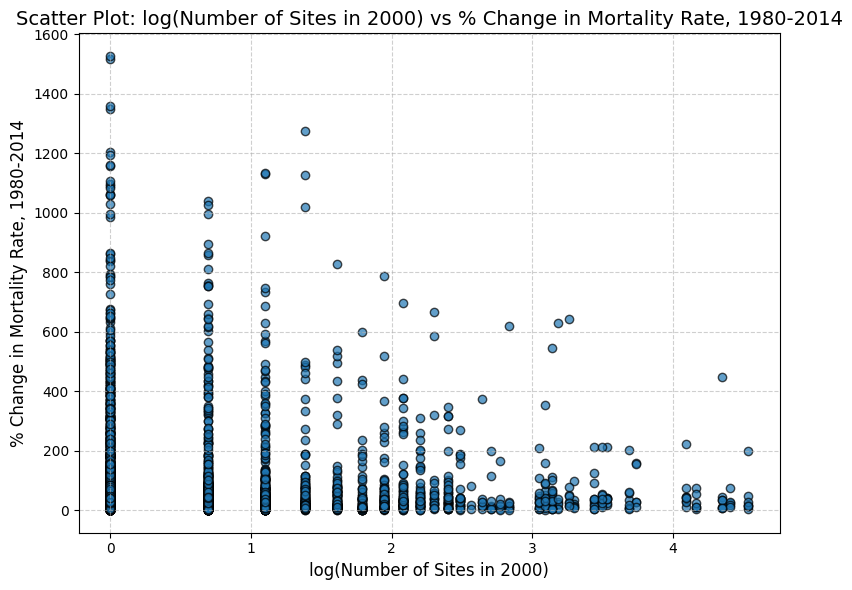

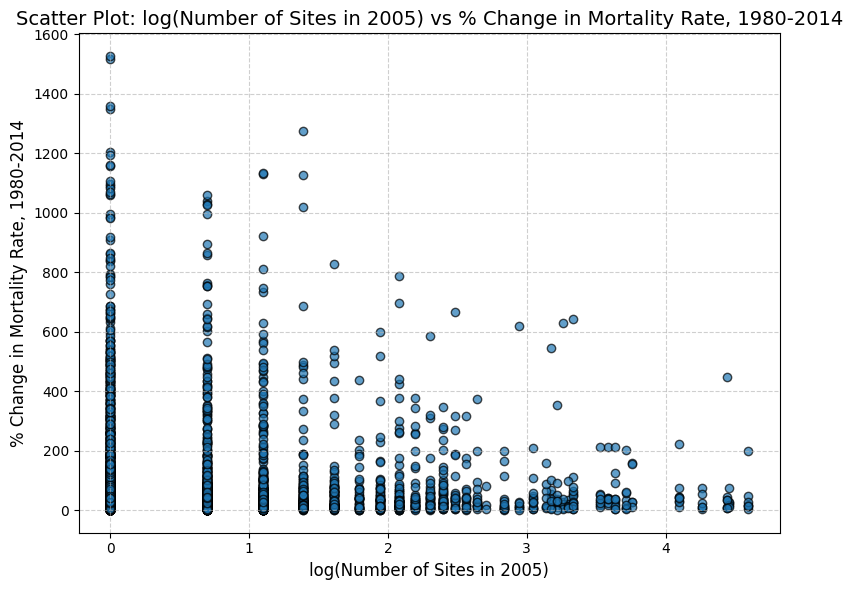

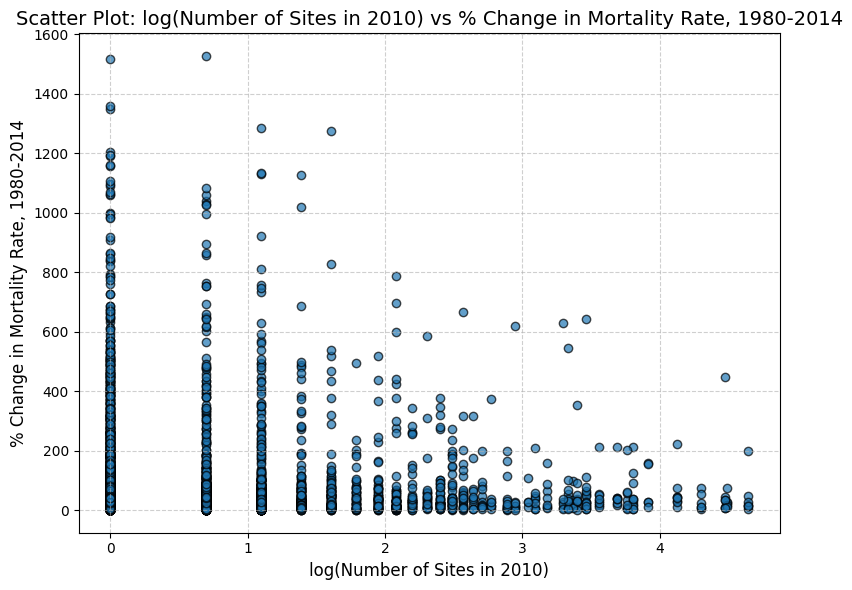

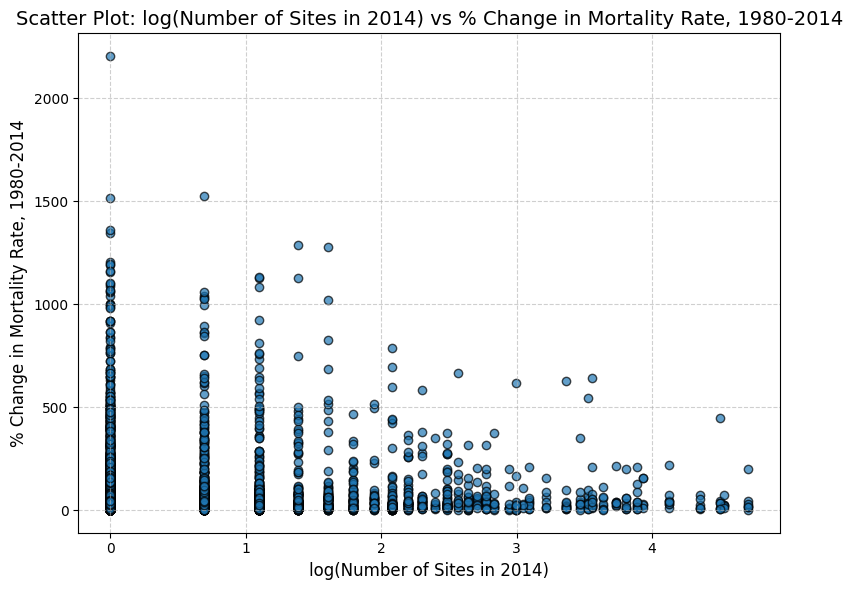

In [ ]:
# Define the targets and independent variables
targets = ['Mortality Rate, 2014*', '% Change in Mortality Rate, 1980-2014']
independent_vars = ['Number of Sites in 1985', 'Number of Sites in 1990', 'Number of Sites in 1995',
                    'Number of Sites in 2000', 'Number of Sites in 2005', 'Number of Sites in 2010',
                    'Number of Sites in 2014']

# itarate through each target and independent variable
for target in targets:
    for var in independent_vars:
        # make sure there are no issues with log transformation
        valid_data = final_sum_df[[var, target]].dropna()  # drop NaN rows
        valid_data = valid_data[(valid_data[var] > 0) & (valid_data[target] > 0)]  #keep only positive values

        if not valid_data.empty:
            # apply a log transformation to the independent variable
            log_var = np.log(valid_data[var])

            # make scatter plot
            plt.figure(figsize=(8, 6))
            plt.scatter(log_var, valid_data[target], alpha=0.7, edgecolors='k')
            plt.title(f'Scatter Plot: log({var}) vs {target}', fontsize=14)
            plt.xlabel(f'log({var})', fontsize=12)
            plt.ylabel(target, fontsize=12)
            plt.grid(True, linestyle='--', alpha=0.6)
            plt.tight_layout()
            plt.show()


As the number of sites increases, there appears to be faint decrease in the general mortality rate that can be seen when taking the log of the number of Superfund sites.

Our "Number of Sites in X" feature is a discrete count variable, shown in the discontinuities in the X axis. In such cases, it can be helpful to apply a square-root transformation to the count variable to obtain a continous representation and potentially indentify trends in data.

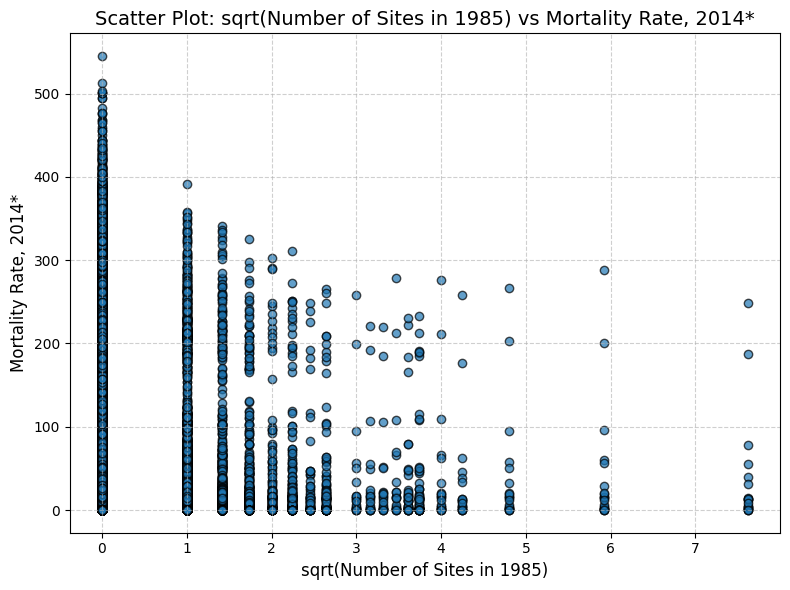

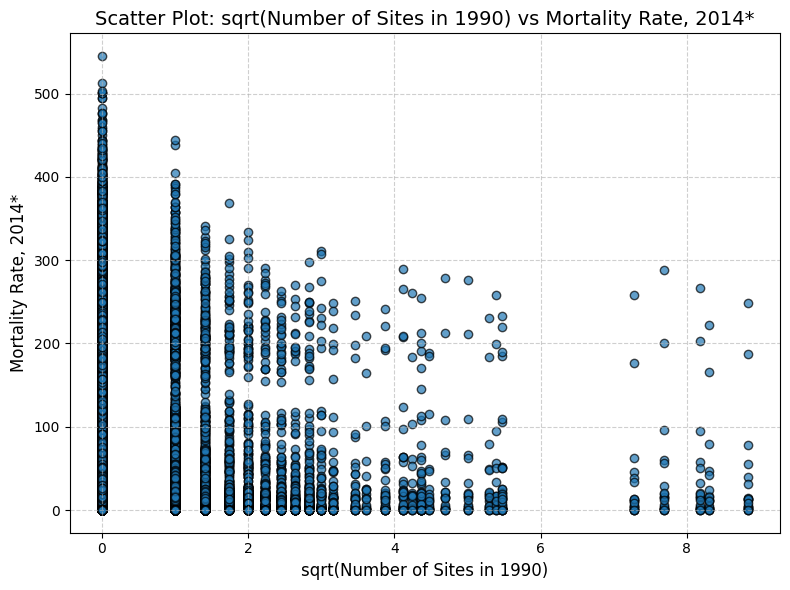

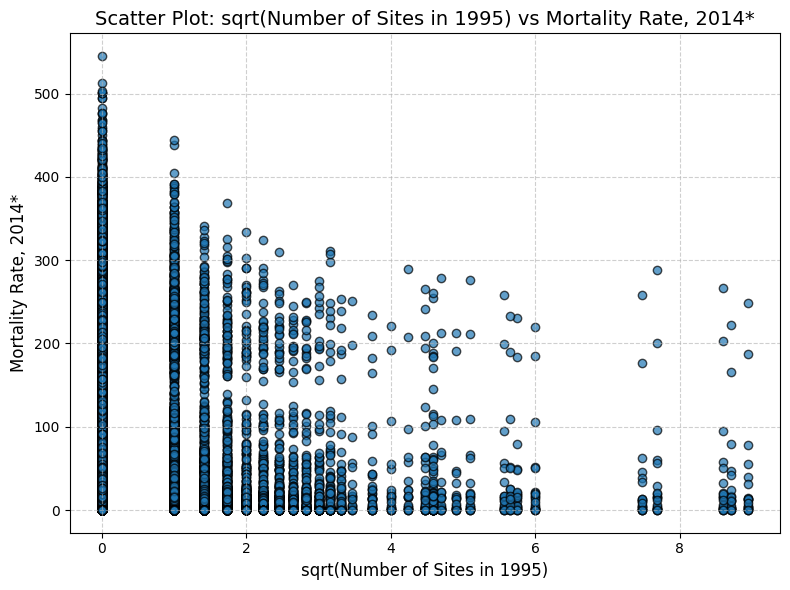

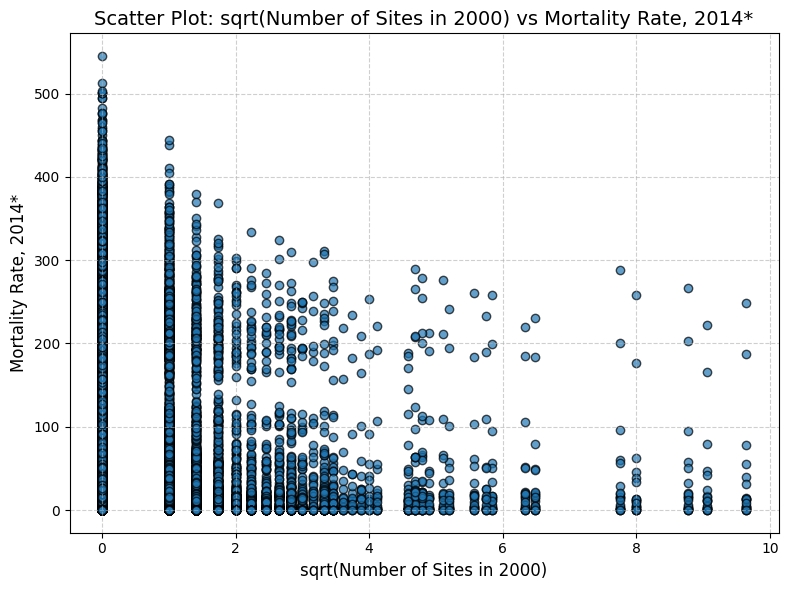

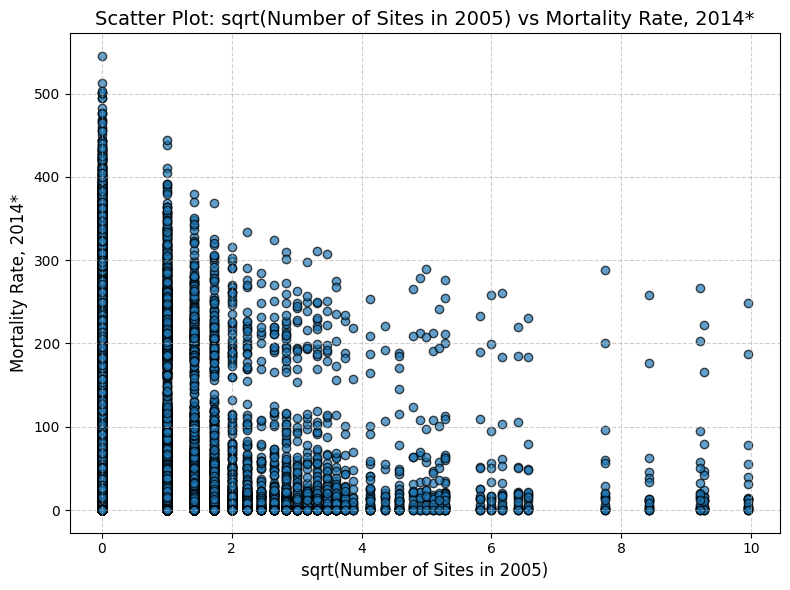

...

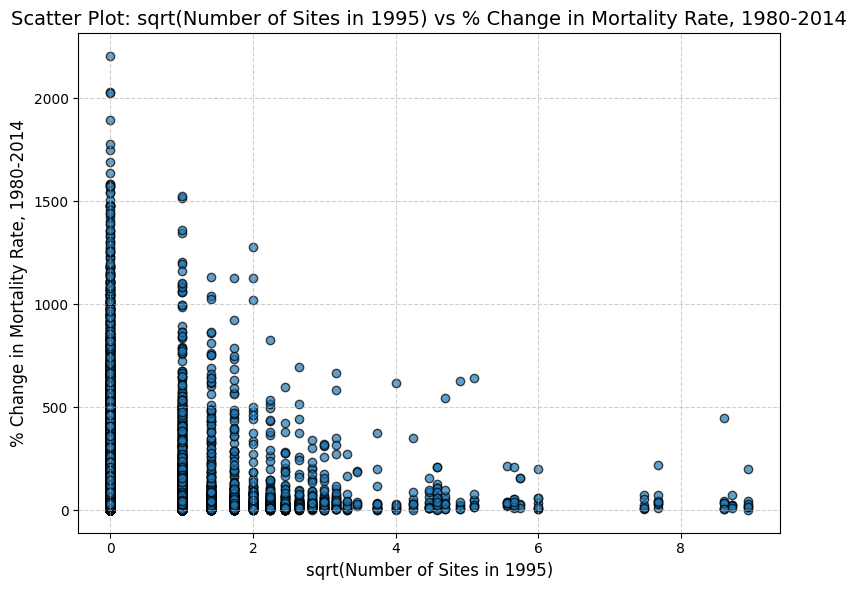

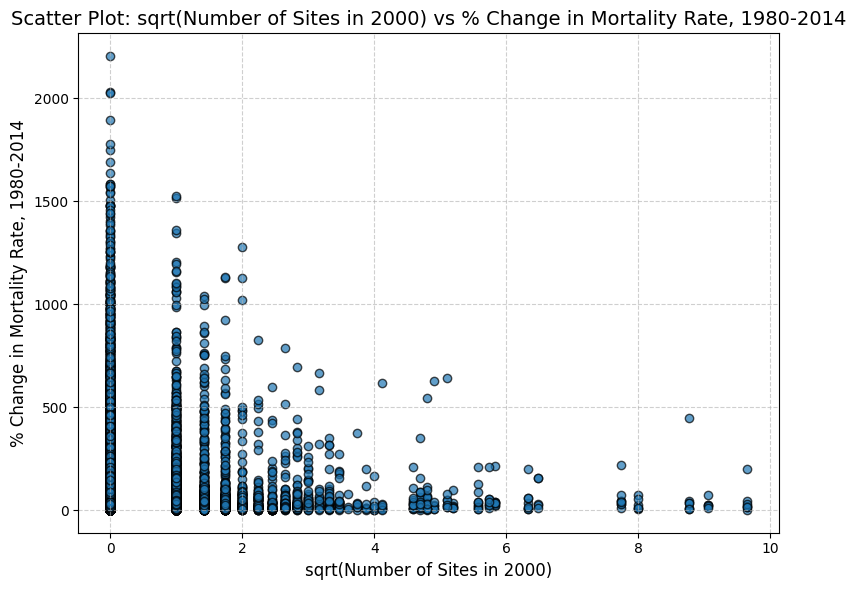

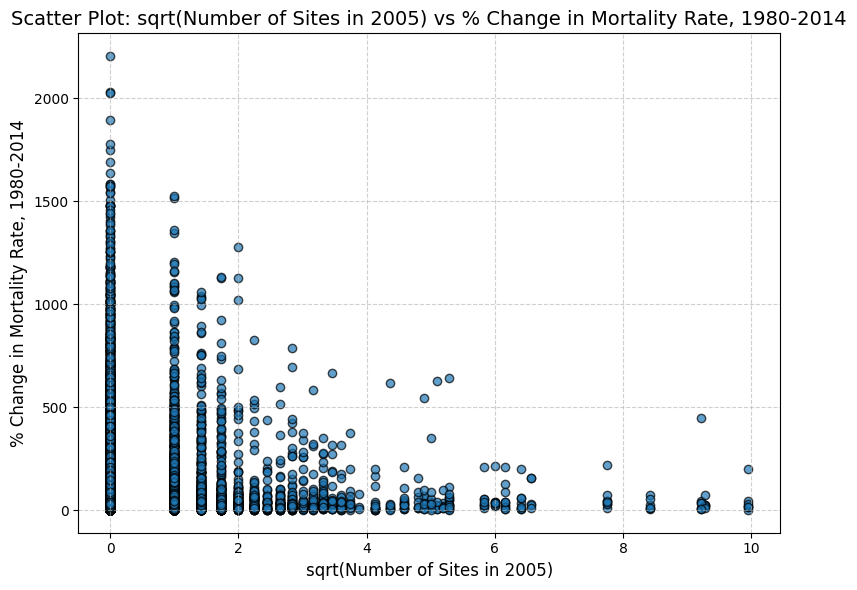

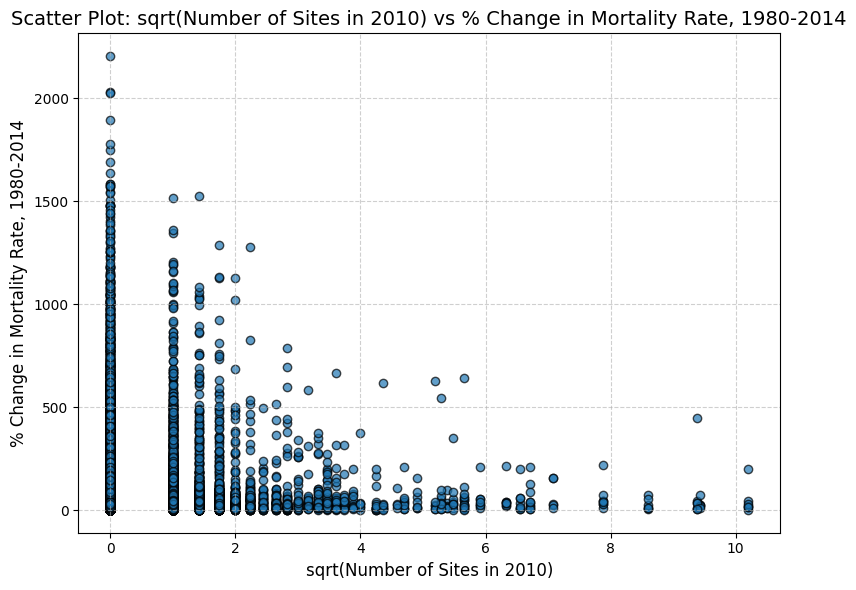

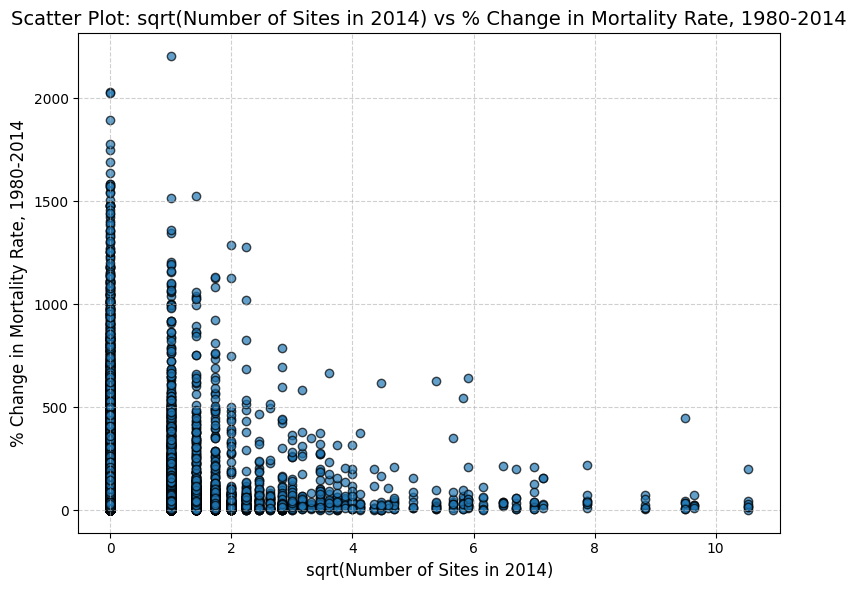

In [ ]:
# define the targets and independent variables
targets = ['Mortality Rate, 2014*', '% Change in Mortality Rate, 1980-2014']
independent_vars = ['Number of Sites in 1985', 'Number of Sites in 1990', 'Number of Sites in 1995',
                    'Number of Sites in 2000', 'Number of Sites in 2005', 'Number of Sites in 2010',
                    'Number of Sites in 2014']

# iterate through each target and independent variable
for target in targets:
    for var in independent_vars:
        # ensure there arnt any issues with square root transformation
        valid_data = final_sum_df[[var, target]].dropna()  # drop rows with NaN
        valid_data = valid_data[(valid_data[var] >= 0) & (valid_data[target] > 0)]  # keep only non-negative values because were taking the square root

        if not valid_data.empty:
            # aply square root
            sqrt_var = np.sqrt(valid_data[var])

            # make scatter plot
            plt.figure(figsize=(8, 6))
            plt.scatter(sqrt_var, valid_data[target], alpha=0.7, edgecolors='k')
            plt.title(f'Scatter Plot: sqrt({var}) vs {target}', fontsize=14)
            plt.xlabel(f'sqrt({var})', fontsize=12)
            plt.ylabel(target, fontsize=12)
            plt.grid(True, linestyle='--', alpha=0.6)
            plt.tight_layout()
            plt.show()

Next, we visualize the scatter plot of Superfund site characteristics and evaluate if a relationship can be perceived between site severity and mortality rate. A square root transformation is applied to the indepdant variables to reduce the impact of large numbers and "compress" the data to reveal trends more effectively.

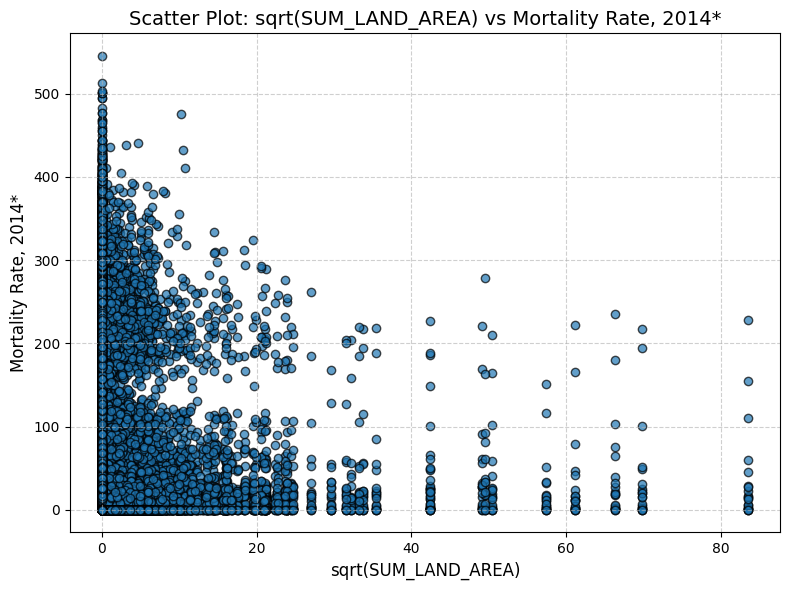

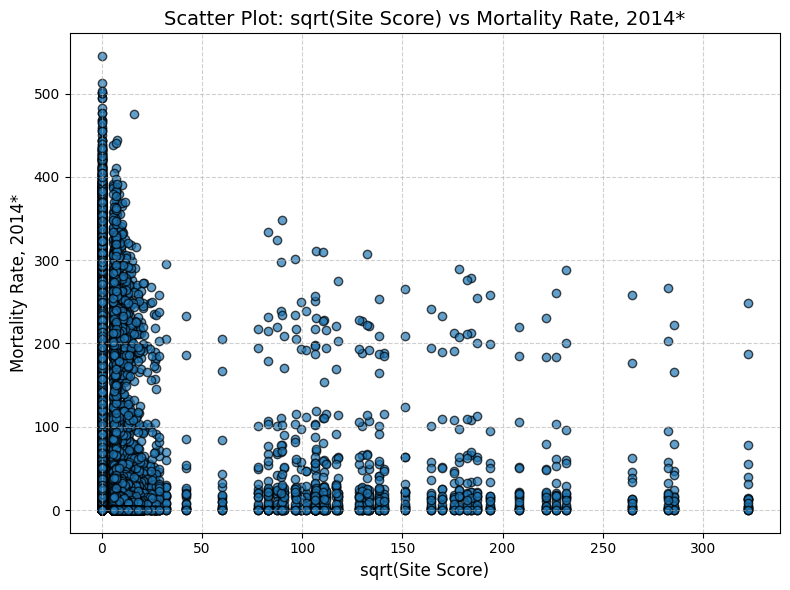

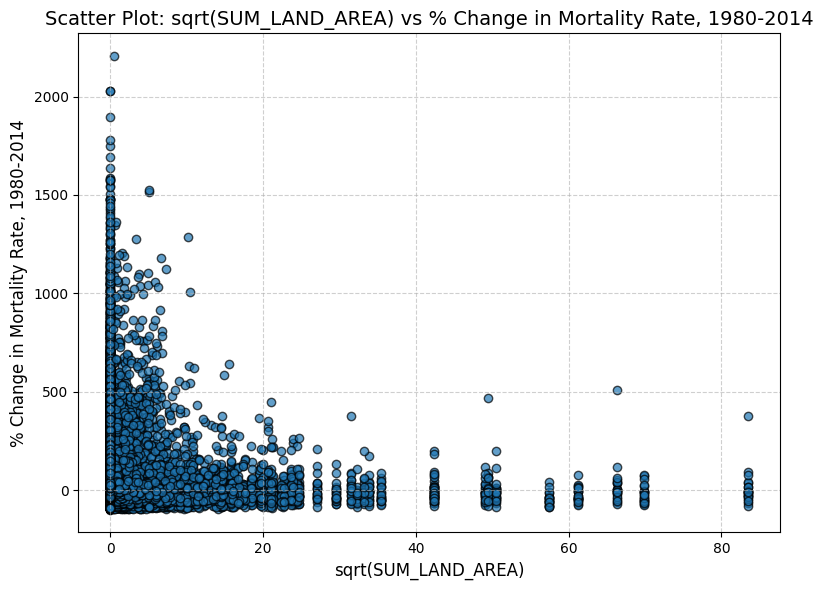

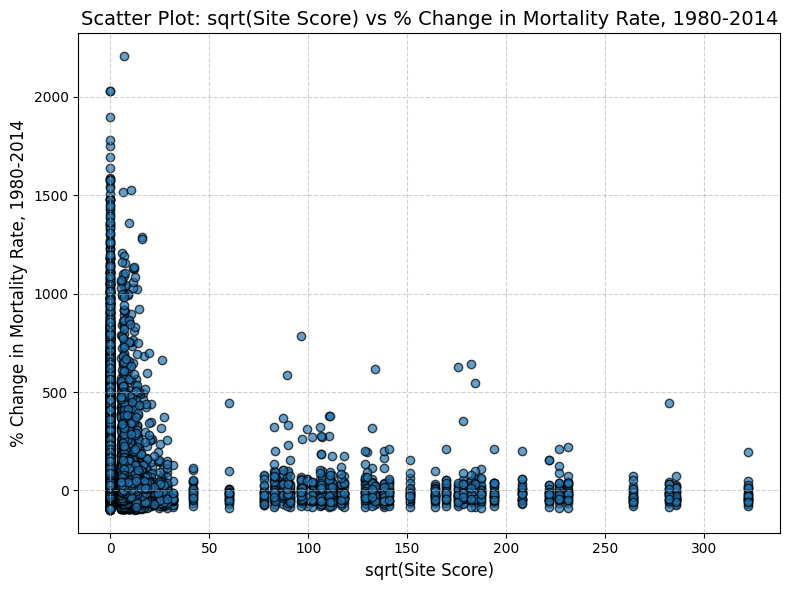

In [ ]:
# define the targets and independent variables
targets = ['Mortality Rate, 2014*', '% Change in Mortality Rate, 1980-2014']
independent_vars = ['SUM_LAND_AREA', 'Site Score']


# iterate through each target and independent variable
for target in targets:
    for var in independent_vars:
        # drop Nan values
        valid_data = final_sum_df[[var, target]].dropna()  # drop Nan rows

        if not valid_data.empty:
            # Apply square root transformation
            sqrt_var = np.sqrt(valid_data[var])

            # scatter plot with square root transformed independent variable
            plt.figure(figsize=(8, 6))
            plt.scatter(sqrt_var, valid_data[target], alpha=0.7, edgecolors='k')
            plt.title(f'Scatter Plot: sqrt({var}) vs {target}', fontsize=14)
            plt.xlabel(f'sqrt({var})', fontsize=12)
            plt.ylabel(target, fontsize=12)
            plt.grid(True, linestyle='--', alpha=0.6)
            plt.tight_layout()
            plt.show()


### Machine Learning Model Development

Approach 1: Predicting Mortality Rate Variation over Time

Before hyperparameter tuning and regularization

Random Forest Regressor Performance:
Mean Squared Error: 10729.373218175828
R-squared: 0.08861952013336938
MAE: 47.233658046596126


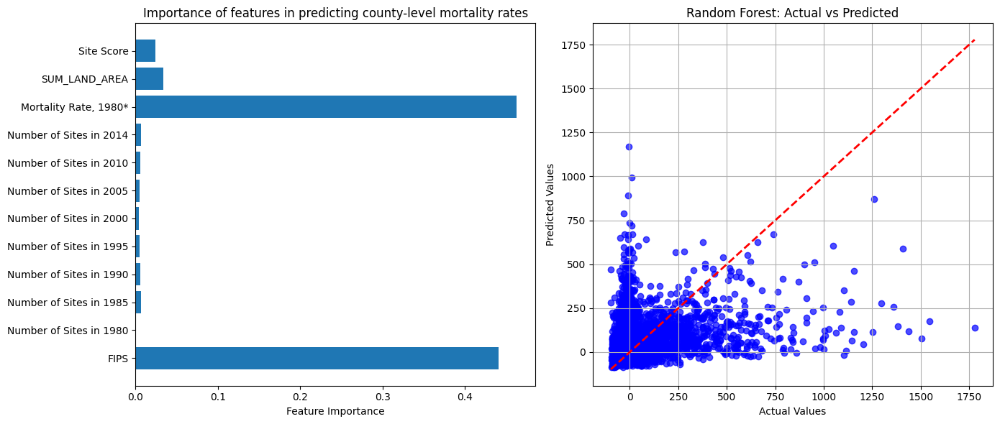

In [ ]:
features = ['FIPS', 'Number of Sites in 1980', 'Number of Sites in 1985', 'Number of Sites in 1990', 'Number of Sites in 1995', 'Number of Sites in 2000', 'Number of Sites in 2005', 'Number of Sites in 2010', 'Number of Sites in 2014', 'Mortality Rate, 1980*', 'SUM_LAND_AREA', 'Site Score']
target = '% Change in Mortality Rate, 1980-2014' #target column of % change

# define the feature matrix and target vector
X = final_sum_df[features]
y = final_sum_df[target]

# scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

#    Random Forest Regression method applied
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# make predictions and evaluate how well random forest did
rf_preds = rf_model.predict(X_test)
rf_mse = mean_squared_error(y_test, rf_preds)
rf_r2 = r2_score(y_test, rf_preds)
rf_mae = mean_absolute_error(y_test, rf_preds)

print("Random Forest Regressor Performance:")
print(f"Mean Squared Error: {rf_mse}")
print(f"R-squared: {rf_r2}")
print(f"MAE: {rf_mae}")

# Plot Feature Importance for RF
importances = rf_model.feature_importances_

# show feature importance and actual vs predicted
plt.figure(figsize=(14, 6))

# plot features
plt.subplot(1, 2, 1)
plt.barh(X.columns, importances)
plt.xlabel('Feature Importance')
plt.title('Importance of features in predicting county-level mortality rates')

# plot for random forest regressor - Actual vs Predicted
plt.subplot(1, 2, 2)
plt.scatter(y_test, rf_preds, alpha=0.7, color='blue')

#Adjust the range of the perfect prediction line based on y_test
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)  # add perfect prediction line

plt.title("Random Forest: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)

# print plots
plt.tight_layout()
plt.show()




XGBoost Regressor Performance:
Mean Squared Error: 9141.768129324855
R-squared: 0.22347476827261759
MAE: 45.73358685426183


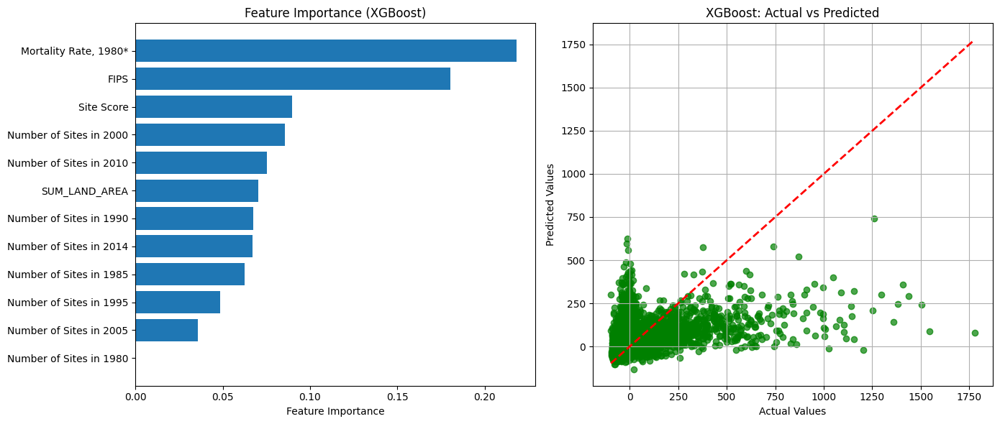

In [ ]:
features = ['FIPS', 'Number of Sites in 1980', 'Number of Sites in 1985', 'Number of Sites in 1990', 'Number of Sites in 1995', 'Number of Sites in 2000', 'Number of Sites in 2005', 'Number of Sites in 2010', 'Number of Sites in 2014', 'Mortality Rate, 1980*', 'SUM_LAND_AREA', 'Site Score']
target = '% Change in Mortality Rate, 1980-2014' # Your target column

# define the feature matrix and target vector
X = final_sum_df[features]
y = final_sum_df[target]

# scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

#use extreme gradient boosting regressor
# Define and train extreme Boost regressor
xgb_model = XGBRegressor(n_estimators=100, random_state=42)
xgb_model.fit(X_train, y_train)

# Make the predictions
xgb_preds = xgb_model.predict(X_test)

# Evaluate extreme Boost performance
xgb_mse = mean_squared_error(y_test, xgb_preds)
xgb_r2 = r2_score(y_test, xgb_preds)
xgb_mae = mean_absolute_error(y_test, xgb_preds)

print("\nXGBoost Regressor Performance:")
print(f"Mean Squared Error: {xgb_mse}")
print(f"R-squared: {xgb_r2}")
print(f"MAE: {xgb_mae}")

# Create a figure for multiple subplots
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# create The Feature Importance Plot
# Sort feature importances
importances = xgb_model.feature_importances_
sorted_idx = np.argsort(importances)

# make a horizontal bar plot
ax[0].barh(range(len(importances)), importances[sorted_idx], align='center')
ax[0].set_yticks(range(len(importances)))
ax[0].set_yticklabels(X.columns[sorted_idx])
ax[0].set_xlabel('Feature Importance')
ax[0].set_title('Feature Importance (XGBoost)')

# actual vs Predicted plot
# Scatter plot for predictions
ax[1].scatter(y_test, xgb_preds, alpha=0.7, color='green')
ax[1].plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)  # Perfect prediction line
ax[1].set_title("XGBoost: Actual vs Predicted")
ax[1].set_xlabel("Actual Values")
ax[1].set_ylabel("Predicted Values")
ax[1].grid(True)

# print plots
plt.tight_layout()
plt.show()

With hyperparameter tuning and regularization

Fitting 3 folds for each of 30 candidates, totalling 90 fits
Random Forest Regressor Performance (After Hyperparameter Tuning):
Mean Squared Error: 9426.482784005591
R-squared: 0.19929037526740268
MAE: 47.38754590583957


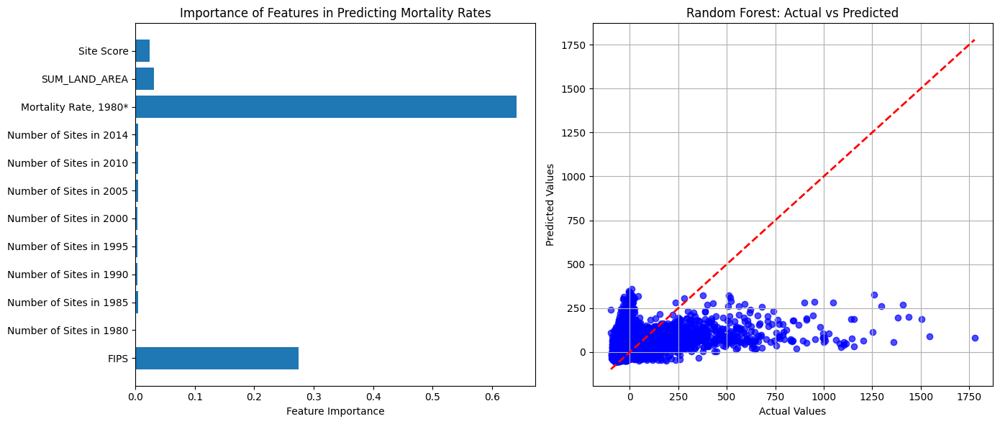

In [ ]:
#hyperparameter tuning for random forest regressor

# randomizedsearchcv was used to randomly sample combination of hyperparameters, n_iter 30 times. basiclaly folds data 3 times.

# features and target definition
features = ['FIPS', 'Number of Sites in 1980', 'Number of Sites in 1985', 'Number of Sites in 1990', 'Number of Sites in 1995',
            'Number of Sites in 2000', 'Number of Sites in 2005', 'Number of Sites in 2010', 'Number of Sites in 2014',
            'Mortality Rate, 1980*', 'SUM_LAND_AREA', 'Site Score']
target = '% Change in Mortality Rate, 1980-2014' # target column

# define the feature matrix and target vector
X = final_sum_df[features]
y = final_sum_df[target]

#scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# randomizedsearchCV for Random Forest with Regularization
rf_model = RandomForestRegressor(random_state=42)

# define the hyperparameter grid for randomizedsearchCV
param_dist = {
    'n_estimators': randint(50, 200),            # # of trees between 50 and 200
    'max_depth': [5, 10, 20],                     # Try tree depths 5 10 and 20
    'min_samples_split': randint(2, 11),          # Try min_samples_split from 2 to 10
    'min_samples_leaf': randint(1, 11),           # Try min_samples_leaf from 1 to 10
    'max_features': ['auto', 'sqrt'],             # Try 'auto' and 'sqrt'
    'bootstrap': [True, False]                    # Try both True and False for bootstrapping
}

#setup randomizedsearchCV
randomized_search = RandomizedSearchCV(
    estimator=rf_model,
    param_distributions=param_dist,
    n_iter=30,  # 30 iterations of random search
    cv=3,       # 3folds of cross validation
    n_jobs=-1,   # use all CPU cores
    random_state=42,
    verbose=2
)

# fit randomizedsearchCV to the data
randomized_search.fit(X_train, y_train)

# Use the best model from randomizedsearchCV
rf_model_tuned = randomized_search.best_estimator_

# evaluate model
rf_preds = rf_model_tuned.predict(X_test)
rf_mse = mean_squared_error(y_test, rf_preds)
rf_r2 = r2_score(y_test, rf_preds)
rf_mae = mean_absolute_error(y_test, rf_preds)

print("Random Forest Regressor Performance (After Hyperparameter Tuning):")
print(f"Mean Squared Error: {rf_mse}")
print(f"R-squared: {rf_r2}")
print(f"MAE: {rf_mae}")

# plot feature importance
importances = rf_model_tuned.feature_importances_

# Visualize feature importance and actual vs predicted
plt.figure(figsize=(14, 6))

# Plot Feature Importance
plt.subplot(1, 2, 1)
plt.barh(X.columns, importances)
plt.xlabel('Feature Importance')
plt.title('Importance of Features in Predicting Mortality Rates')

# Plot Actual vs Predicted for Random Forest Regressor
plt.subplot(1, 2, 2)
plt.scatter(y_test, rf_preds, alpha=0.7, color='blue')

# Adjust the range of the perfect prediction line based on y_test
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)  # Perfect prediction line

plt.title("Random Forest: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)

# print plots
plt.tight_layout()
plt.show()


XGBoost Regressor Performance with Alternative Regularization Strategy:
Mean Squared Error: 8966.882782025406
R-squared: 0.23832997821847057
MAE: 46.903842160108304


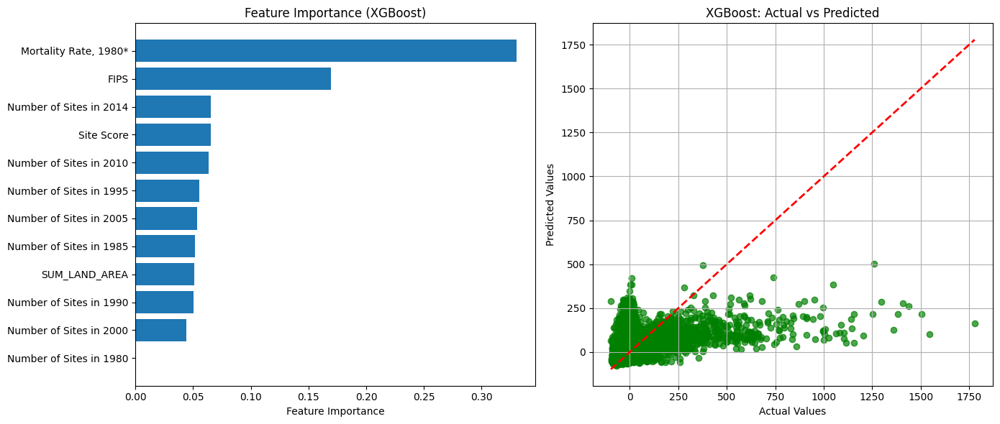

In [ ]:
# This model was tuned by increasing the number of estimators to allow for more rounds of boosting.
# The max depth was increased to 6 as well, allowing the model to capture more complex patterns.
# The alpha, beta, and gamma parameters were also tuned for to reduce overfitting and be more selective when "splitting" decision trees.
# "Early Stopping" was also implemented if model performance does not improve for 10 consecutive rounds (prevents overfitting)

# features and target variable
features = ['FIPS', 'Number of Sites in 1980', 'Number of Sites in 1985', 'Number of Sites in 1990', 'Number of Sites in 1995', 'Number of Sites in 2000', 'Number of Sites in 2005', 'Number of Sites in 2010', 'Number of Sites in 2014', 'Mortality Rate, 1980*', 'SUM_LAND_AREA', 'Site Score']
target = '% Change in Mortality Rate, 1980-2014'

# define the feature matrix and target vector
X = final_sum_df[features]
y = final_sum_df[target]

# scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Extreme Gradient Boosting Regressor
# define and train extreme Boost Regressor with a different regularization strategy
xgb_model = XGBRegressor(
    n_estimators=200,  # Increase the number of trees for better performance
    random_state=42,
    learning_rate=0.1,  # Keep the learning rate a bit higher to make use of more trees
    max_depth=6,         # Increase depth to allow more complexity in the model (use larger trees)
    alpha=0.5,           # L1 regularization (Lasso), moderate regularization
    lambda_=0.5,         # L2 regularization (Ridge), moderate regularization
    gamma=0.1,           # Minimum loss reduction to make splits more conservative
    subsample=0.9,       # Use 90% of the data for each tree, increasing flexibility
    colsample_bytree=0.9, # Use 90% of the features for each tree, increasing flexibility
    early_stopping_rounds=10,  # Stop early if no improvement on validation set for 10 rounds
    n_jobs=-1             # Use all CPU cores
)

# Fit the model to the training data
xgb_model.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=False)

# Make the predictions
xgb_preds = xgb_model.predict(X_test)

# Evaluate XGBoost performance
xgb_mse = mean_squared_error(y_test, xgb_preds)
xgb_r2 = r2_score(y_test, xgb_preds)
xgb_mae = mean_absolute_error(y_test, xgb_preds)

print("\nXGBoost Regressor Performance with Alternative Regularization Strategy:")
print(f"Mean Squared Error: {xgb_mse}")
print(f"R-squared: {xgb_r2}")
print(f"MAE: {xgb_mae}")

# Create a figure for multiple subplots
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

#feature importance plot
# sort feature importances
importances = xgb_model.feature_importances_
sorted_idx = np.argsort(importances)

# make horizontal bar plot
ax[0].barh(range(len(importances)), importances[sorted_idx], align='center')
ax[0].set_yticks(range(len(importances)))
ax[0].set_yticklabels(X.columns[sorted_idx])
ax[0].set_xlabel('Feature Importance')
ax[0].set_title('Feature Importance (XGBoost)')

# Actual vs Predicted Plot
# Scatter plot for predictions
ax[1].scatter(y_test, xgb_preds, alpha=0.7, color='green')
ax[1].plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)  #add perfect prediction line
ax[1].set_title("XGBoost: Actual vs Predicted")
ax[1].set_xlabel("Actual Values")
ax[1].set_ylabel("Predicted Values")
ax[1].grid(True)

# finalize layout and show plots
plt.tight_layout()
plt.show()

Approach 2: Predicting Current Mortality Rate.

Before hyperparameter tuning and regularization

Random Forest Regressor Performance:
Mean Squared Error: 211.97131291830698
R-squared: 0.9590373640496981
MAE: 7.576537571360539


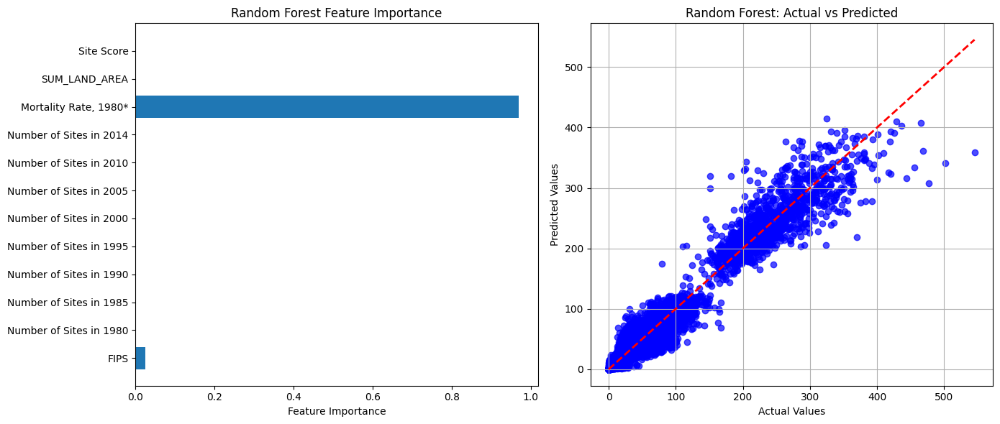

In [ ]:
# define features and target
features = ['FIPS', 'Number of Sites in 1980', 'Number of Sites in 1985', 'Number of Sites in 1990',
            'Number of Sites in 1995', 'Number of Sites in 2000', 'Number of Sites in 2005',
            'Number of Sites in 2010', 'Number of Sites in 2014', 'Mortality Rate, 1980*',
            'SUM_LAND_AREA', 'Site Score']
target = 'Mortality Rate, 2014*'  # your target column

# define the feature matrix and target vector
X = final_sum_df[features]
y = final_sum_df[target]

# scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# random forest regressor
rf_model = RandomForestRegressor(n_estimators=130, random_state=42)
rf_model.fit(X_train, y_train)

# make predictions and evaluate performance
rf_preds = rf_model.predict(X_test)
rf_mse = mean_squared_error(y_test, rf_preds)
rf_r2 = r2_score(y_test, rf_preds)
rf_mae = mean_absolute_error(y_test, rf_preds)

print("Random Forest Regressor Performance:")
print(f"Mean Squared Error: {rf_mse}")
print(f"R-squared: {rf_r2}")
print(f"MAE: {rf_mae}")

# visualise Feature Importance and Actual versus Predicted
plt.figure(figsize=(14, 6))

# Plot Feature Importance for Random Forest
importances_rf = rf_model.feature_importances_
plt.subplot(1, 2, 1)
plt.barh(X.columns, importances_rf)
plt.xlabel('Feature Importance')
plt.title('Random Forest Feature Importance')

# Plot Actual vs Predicted for Random Forest Regressor
plt.subplot(1, 2, 2)
plt.scatter(y_test, rf_preds, alpha=0.7, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)  # Perfect prediction line
plt.title("Random Forest: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)

# print the plots
plt.tight_layout()
plt.show()


XGBoost Regressor Performance:
Mean Squared Error: 190.97084161090788
R-squared: 0.9630956238637574
MAE: 7.366234697096374


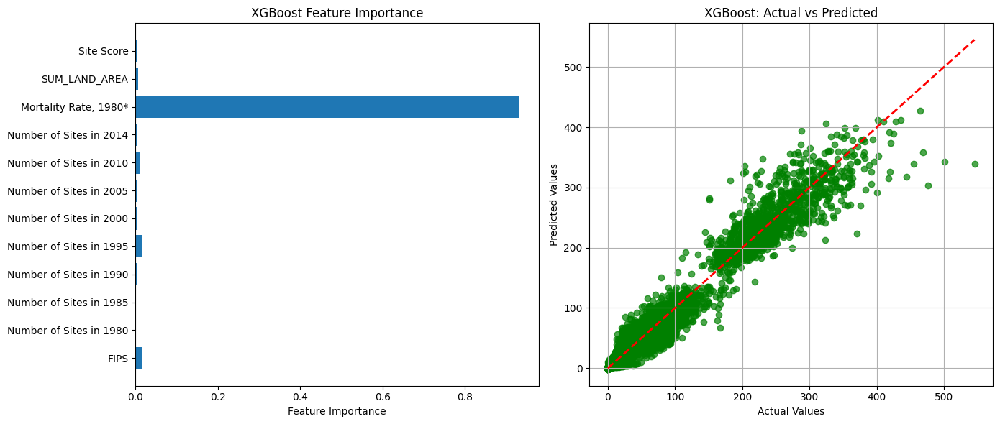

In [ ]:
# define features and target
features = ['FIPS', 'Number of Sites in 1980', 'Number of Sites in 1985', 'Number of Sites in 1990',
            'Number of Sites in 1995', 'Number of Sites in 2000', 'Number of Sites in 2005',
            'Number of Sites in 2010', 'Number of Sites in 2014', 'Mortality Rate, 1980*',
            'SUM_LAND_AREA', 'Site Score']
target = 'Mortality Rate, 2014*'  # the target column

# define the feature matrix and target vector
X = final_sum_df[features]
y = final_sum_df[target]

# scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

#extreme Gradiant Boost Regressor
xgb_model = XGBRegressor(n_estimators=100, random_state=42)
xgb_model.fit(X_train, y_train)

# make predictions and evaluate performance
xgb_preds = xgb_model.predict(X_test)
xgb_mse = mean_squared_error(y_test, xgb_preds)
xgb_r2 = r2_score(y_test, xgb_preds)
xgb_mae = mean_absolute_error(y_test, xgb_preds)

print("XGBoost Regressor Performance:")
print(f"Mean Squared Error: {xgb_mse}")
print(f"R-squared: {xgb_r2}")
print(f"MAE: {xgb_mae}")

# visualize Feature Importance and Actual vs Predicted
plt.figure(figsize=(14, 6))

# Plot Feature Importance for extreme Gradient Boost
importances_xgb = xgb_model.feature_importances_
plt.subplot(1, 2, 1)
plt.barh(X.columns, importances_xgb)
plt.xlabel('Feature Importance')
plt.title('XGBoost Feature Importance')

# Plot Actual vs Predicted for XGBoost Regressor
plt.subplot(1, 2, 2)
plt.scatter(y_test, xgb_preds, alpha=0.7, color='green')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)  # Perfect prediction line
plt.title("XGBoost: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)

# Show the plots
plt.tight_layout()
plt.show()


With hyperparameter tuning and regularization

Fitting 3 folds for each of 30 candidates, totalling 90 fits
Optimized Random Forest Regressor Performance:
Mean Squared Error: 206.16416751950064
R-squared: 0.9601595724259487
MAE: 7.559008996690506
Fitting 3 folds for each of 30 candidates, totalling 90 fits

Optimized Extra Trees Regressor Performance:
Mean Squared Error: 210.18581333323021
R-squared: 0.9593824049351177
MAE: 7.721300723413853


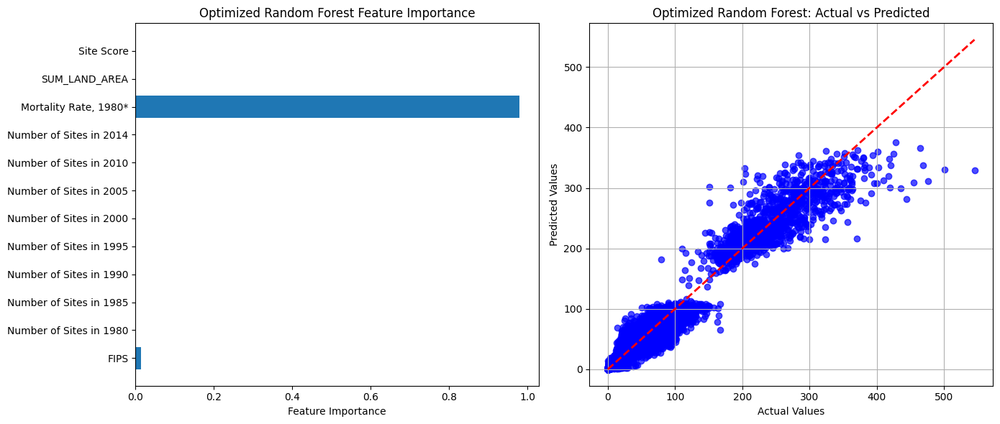

In [ ]:
# RandomizedSearchCV was used here to randomly test different hyperparameter combinations within a specified range
# Extra Trees Regressor was used here as well as an alternative.

# define features and target
features = ['FIPS', 'Number of Sites in 1980', 'Number of Sites in 1985', 'Number of Sites in 1990',
            'Number of Sites in 1995', 'Number of Sites in 2000', 'Number of Sites in 2005',
            'Number of Sites in 2010', 'Number of Sites in 2014', 'Mortality Rate, 1980*',
            'SUM_LAND_AREA', 'Site Score']
target = 'Mortality Rate, 2014*'  # target column

# define the feature matrix and target vector
X = final_sum_df[features]
y = final_sum_df[target]

#scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# RandomizedSearchCV to tune the Random Forest and Extra Trees
# Define hyperparameter grids for tuning
param_dist = {
    'n_estimators': [100, 130, 150, 200],
    'max_depth': [5, 10, 15, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
    'bootstrap': [True, False]
}

# RandomizedSearchCV for RandomForestRegressor
rf_model = RandomForestRegressor(random_state=42)
random_search_rf = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=30, cv=3, random_state=42, n_jobs=-1, verbose=2)
random_search_rf.fit(X_train, y_train)

# Best model from RandomizedSearchCV
best_rf_model = random_search_rf.best_estimator_

# evaluate performance of the best randomforest model
rf_preds = best_rf_model.predict(X_test)
rf_mse = mean_squared_error(y_test, rf_preds)
rf_r2 = r2_score(y_test, rf_preds)
rf_mae = mean_absolute_error(y_test, rf_preds)

print("Optimized Random Forest Regressor Performance:")
print(f"Mean Squared Error: {rf_mse}")
print(f"R-squared: {rf_r2}")
print(f"MAE: {rf_mae}")

#Extra Trees Regressor Model with RandomizedSearchCV
# RandomizedSearchCV for ExtraTreesRegressor an alternative tree model
et_model = ExtraTreesRegressor(random_state=42)
random_search_et = RandomizedSearchCV(estimator=et_model, param_distributions=param_dist, n_iter=30, cv=3, random_state=42, n_jobs=-1, verbose=2)
random_search_et.fit(X_train, y_train)

# Best model from ExtraTrees
best_et_model = random_search_et.best_estimator_

# evaluate performance of the best ExtraTrees model
et_preds = best_et_model.predict(X_test)
et_mse = mean_squared_error(y_test, et_preds)
et_r2 = r2_score(y_test, et_preds)
et_mae = mean_absolute_error(y_test, et_preds)

print("\nOptimized Extra Trees Regressor Performance:")
print(f"Mean Squared Error: {et_mse}")
print(f"R-squared: {et_r2}")
print(f"MAE: {et_mae}")

# Visualization: Feature Importance and Actual vs Predicted
plt.figure(figsize=(14, 6))

# Plot Feature Importance for Random Forest
importances_rf = best_rf_model.feature_importances_
plt.subplot(1, 2, 1)
plt.barh(X.columns, importances_rf)
plt.xlabel('Feature Importance')
plt.title('Optimized Random Forest Feature Importance')

# Plot Actual vs Predicted for Random Forest Regressor
plt.subplot(1, 2, 2)
plt.scatter(y_test, rf_preds, alpha=0.7, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)  # Perfect the prediction line
plt.title("Optimized Random Forest: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)

# print the plots
plt.tight_layout()
plt.show()


XGBoost Regressor Performance:
Mean Squared Error: 186.89180301924898
R-squared: 0.9638838822868288
MAE: 7.31338350322778


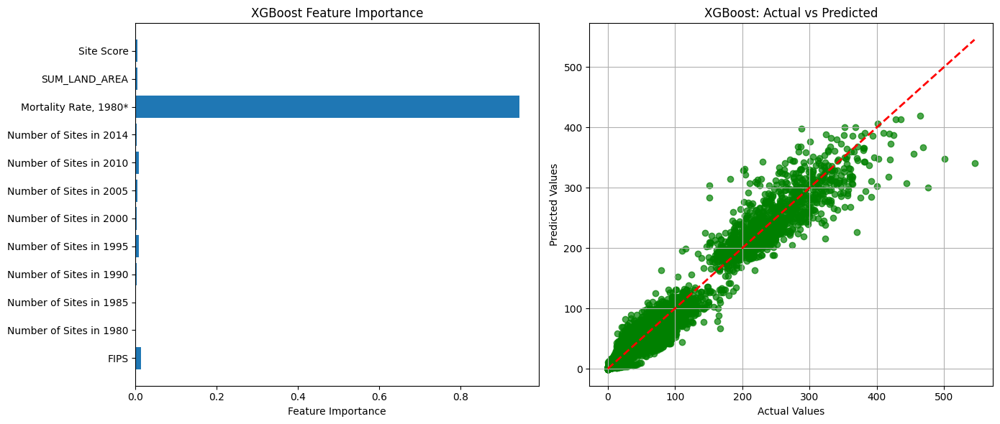

In [ ]:
# Marginal improvement in performance was attained by tweaking the number of iterations and learning rate

# define features and target
features = ['FIPS', 'Number of Sites in 1980', 'Number of Sites in 1985', 'Number of Sites in 1990',
            'Number of Sites in 1995', 'Number of Sites in 2000', 'Number of Sites in 2005',
            'Number of Sites in 2010', 'Number of Sites in 2014', 'Mortality Rate, 1980*',
            'SUM_LAND_AREA', 'Site Score']
target = 'Mortality Rate, 2014*'  # the target column

# define the feature matrix and target vector
X = final_sum_df[features]
y = final_sum_df[target]

# scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

#extreme GBoost Regressor
xgb_model = XGBRegressor(n_estimators=130, random_state=42, learning_rate = 0.14, max_depth = 6)

xgb_model.fit(X_train, y_train,  eval_set=[(X_test, y_test)], verbose=False)

# make predictions and evaluate performance
xgb_preds = xgb_model.predict(X_test)
xgb_mse = mean_squared_error(y_test, xgb_preds)
xgb_r2 = r2_score(y_test, xgb_preds)
xgb_mae = mean_absolute_error(y_test, xgb_preds)

print("XGBoost Regressor Performance:")
print(f"Mean Squared Error: {xgb_mse}")
print(f"R-squared: {xgb_r2}")
print(f"MAE: {xgb_mae}")

# - visualizing  Feature Importance and Actual vs Predicted
plt.figure(figsize=(14, 6))

# Plot Feature Importance for xtreme GBoost
importances_xgb = xgb_model.feature_importances_
plt.subplot(1, 2, 1)
plt.barh(X.columns, importances_xgb)
plt.xlabel('Feature Importance')
plt.title('XGBoost Feature Importance')

# Plot Actual vs Predicted for XGBoost Regressor
plt.subplot(1, 2, 2)
plt.scatter(y_test, xgb_preds, alpha=0.7, color='green')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)  # Perfect prediction line
plt.title("XGBoost: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)

# print the plots
plt.tight_layout()
plt.show()

Approach 3: Predicting the number of nearby Superfund sites using health data.

Before hyperparameter tuning and regularization

Random Forest Regressor Performance:
Mean Squared Error: 12.026805508560283
R-squared: 0.40796511724876694
MAE: 0.8337763437553071


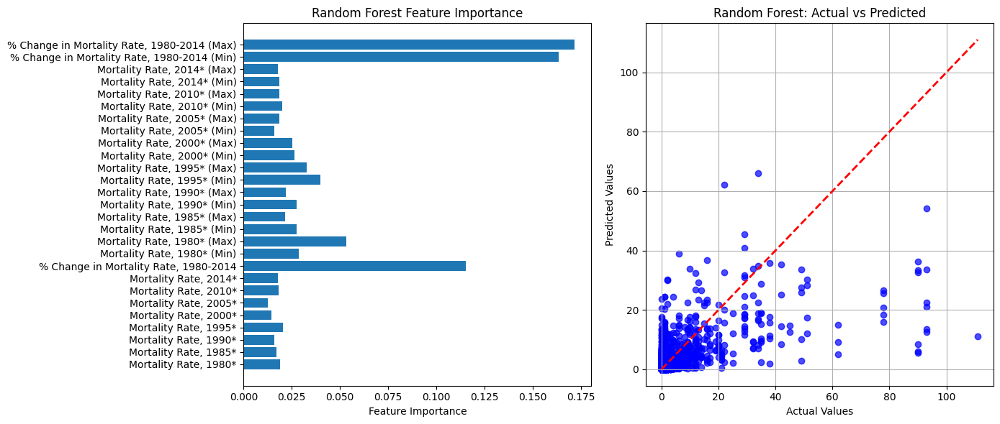

In [ ]:
# define features and target
features = [
    'Mortality Rate, 1980*', 'Mortality Rate, 1985*', 'Mortality Rate, 1990*',
    'Mortality Rate, 1995*', 'Mortality Rate, 2000*', 'Mortality Rate, 2005*',
    'Mortality Rate, 2010*', 'Mortality Rate, 2014*', '% Change in Mortality Rate, 1980-2014',
    'Mortality Rate, 1980* (Min)', 'Mortality Rate, 1980* (Max)',
    'Mortality Rate, 1985* (Min)', 'Mortality Rate, 1985* (Max)',
    'Mortality Rate, 1990* (Min)', 'Mortality Rate, 1990* (Max)',
    'Mortality Rate, 1995* (Min)', 'Mortality Rate, 1995* (Max)',
    'Mortality Rate, 2000* (Min)', 'Mortality Rate, 2000* (Max)',
    'Mortality Rate, 2005* (Min)', 'Mortality Rate, 2005* (Max)',
    'Mortality Rate, 2010* (Min)', 'Mortality Rate, 2010* (Max)',
    'Mortality Rate, 2014* (Min)', 'Mortality Rate, 2014* (Max)',
    '% Change in Mortality Rate, 1980-2014 (Min)', '% Change in Mortality Rate, 1980-2014 (Max)'
]

target = 'Number of Sites in 2014'  # the target column

# Define the feature matrix and target vector
X = final_sum_df[features]
y = final_sum_df[target]

# scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

#  Random Forest Regression
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# make predictions and evaluate performance
rf_preds = rf_model.predict(X_test)
rf_mse = mean_squared_error(y_test, rf_preds)
rf_r2 = r2_score(y_test, rf_preds)
rf_mae = mean_absolute_error(y_test, rf_preds)

print("Random Forest Regressor Performance:")
print(f"Mean Squared Error: {rf_mse}")
print(f"R-squared: {rf_r2}")
print(f"MAE: {rf_mae}")

# Feature Importance and Actual vs Predicted
plt.figure(figsize=(14, 6))

# plot Feature Importance for Random Forest
importances = rf_model.feature_importances_
plt.subplot(1, 2, 1)
plt.barh(X.columns, importances)
plt.xlabel('Feature Importance')
plt.title('Random Forest Feature Importance')

# Plot Actual vs Predicted for Random Forest
plt.subplot(1, 2, 2)
plt.scatter(y_test, rf_preds, alpha=0.7, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)  # Perfect prediction line
plt.title("Random Forest: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)

# print the plots
plt.tight_layout()
plt.show()

XGBoost Regressor Performance:
Mean Squared Error: 12.570246448668332
R-squared: 0.38121354579925537
MAE: 0.8844307759447176


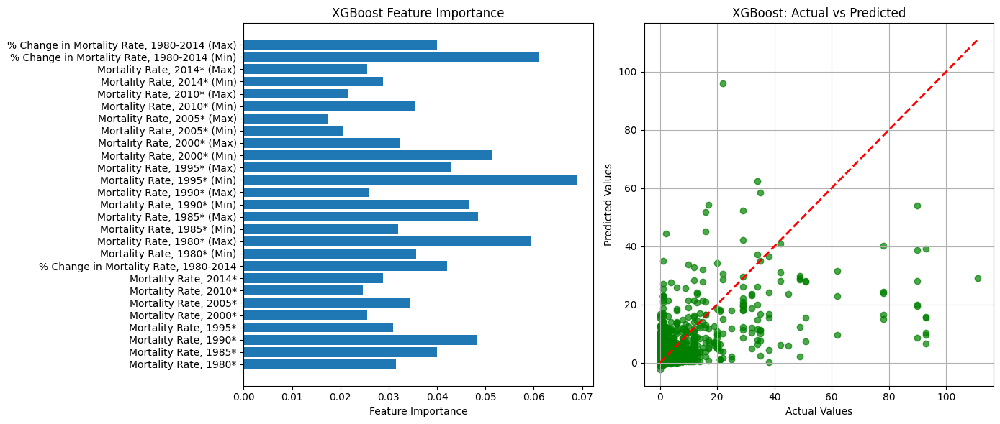

In [ ]:
# Define features and target
features = [
    'Mortality Rate, 1980*', 'Mortality Rate, 1985*', 'Mortality Rate, 1990*',
    'Mortality Rate, 1995*', 'Mortality Rate, 2000*', 'Mortality Rate, 2005*',
    'Mortality Rate, 2010*', 'Mortality Rate, 2014*', '% Change in Mortality Rate, 1980-2014',
    'Mortality Rate, 1980* (Min)', 'Mortality Rate, 1980* (Max)',
    'Mortality Rate, 1985* (Min)', 'Mortality Rate, 1985* (Max)',
    'Mortality Rate, 1990* (Min)', 'Mortality Rate, 1990* (Max)',
    'Mortality Rate, 1995* (Min)', 'Mortality Rate, 1995* (Max)',
    'Mortality Rate, 2000* (Min)', 'Mortality Rate, 2000* (Max)',
    'Mortality Rate, 2005* (Min)', 'Mortality Rate, 2005* (Max)',
    'Mortality Rate, 2010* (Min)', 'Mortality Rate, 2010* (Max)',
    'Mortality Rate, 2014* (Min)', 'Mortality Rate, 2014* (Max)',
    '% Change in Mortality Rate, 1980-2014 (Min)', '% Change in Mortality Rate, 1980-2014 (Max)'
]

target = 'Number of Sites in 2014'  # the target column

# fefine the feature matrix and target vector
X = final_sum_df[features]
y = final_sum_df[target]

# scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# extreme gradient boost regressor
xgb_model = XGBRegressor(n_estimators=100, random_state=42, objective='reg:squarederror')
xgb_model.fit(X_train, y_train)

# make predictions and evaluate performance
xgb_preds = xgb_model.predict(X_test)
xgb_mse = mean_squared_error(y_test, xgb_preds)
xgb_r2 = r2_score(y_test, xgb_preds)
xgb_mae = mean_absolute_error(y_test, xgb_preds)

print("XGBoost Regressor Performance:")
print(f"Mean Squared Error: {xgb_mse}")
print(f"R-squared: {xgb_r2}")
print(f"MAE: {xgb_mae}")

# visualizing Feature Importance and Actual vs Predicted
plt.figure(figsize=(14, 6))

# Plot Feature Importance for XGBoost
importances = xgb_model.feature_importances_
plt.subplot(1, 2, 1)
plt.barh(features, importances)
plt.xlabel('Feature Importance')
plt.title('XGBoost Feature Importance')

# Plot Actual vs Predicted for XGBoost
plt.subplot(1, 2, 2)
plt.scatter(y_test, xgb_preds, alpha=0.7, color='green')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)  # Perfect prediction line
plt.title("XGBoost: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)

# print plots
plt.tight_layout()
plt.show()


After hyperparameter tuning and regularization

Random Forest Regressor Performance:
Mean Squared Error: 11.945336573795398
R-squared: 0.4119755297566491
MAE: 0.8299526422764262


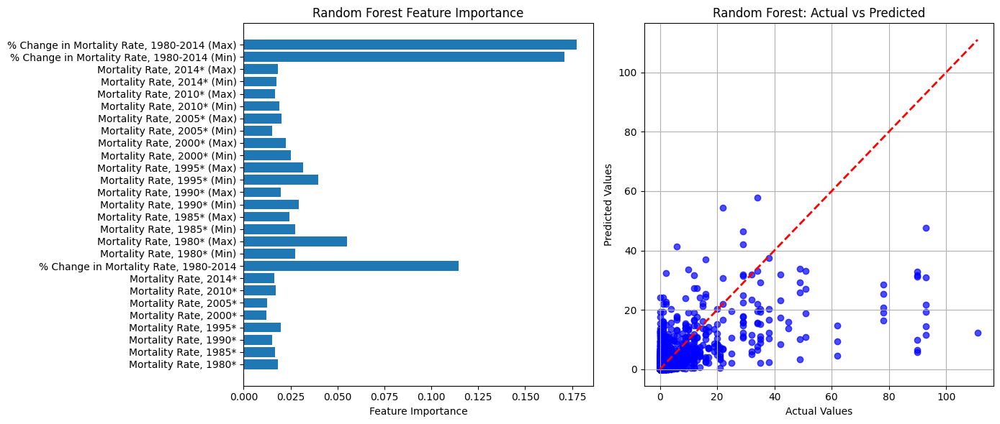

In [ ]:
# Performance improved by increasing the number of iterations and minimum number of samples to split
# define features and target
features = [
    'Mortality Rate, 1980*', 'Mortality Rate, 1985*', 'Mortality Rate, 1990*',
    'Mortality Rate, 1995*', 'Mortality Rate, 2000*', 'Mortality Rate, 2005*',
    'Mortality Rate, 2010*', 'Mortality Rate, 2014*', '% Change in Mortality Rate, 1980-2014',
    'Mortality Rate, 1980* (Min)', 'Mortality Rate, 1980* (Max)',
    'Mortality Rate, 1985* (Min)', 'Mortality Rate, 1985* (Max)',
    'Mortality Rate, 1990* (Min)', 'Mortality Rate, 1990* (Max)',
    'Mortality Rate, 1995* (Min)', 'Mortality Rate, 1995* (Max)',
    'Mortality Rate, 2000* (Min)', 'Mortality Rate, 2000* (Max)',
    'Mortality Rate, 2005* (Min)', 'Mortality Rate, 2005* (Max)',
    'Mortality Rate, 2010* (Min)', 'Mortality Rate, 2010* (Max)',
    'Mortality Rate, 2014* (Min)', 'Mortality Rate, 2014* (Max)',
    '% Change in Mortality Rate, 1980-2014 (Min)', '% Change in Mortality Rate, 1980-2014 (Max)'
]

target = 'Number of Sites in 2014'  # the target column

# define the feature matrix and target vector
X = final_sum_df[features]
y = final_sum_df[target]

# scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

#Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=150, random_state=42, min_samples_split = 4)
rf_model.fit(X_train, y_train)

# make predictions and evaluate performance
rf_preds = rf_model.predict(X_test)
rf_mse = mean_squared_error(y_test, rf_preds)
rf_r2 = r2_score(y_test, rf_preds)
rf_mae = mean_absolute_error(y_test, rf_preds)

print("Random Forest Regressor Performance:")
print(f"Mean Squared Error: {rf_mse}")
print(f"R-squared: {rf_r2}")
print(f"MAE: {rf_mae}")

#  Feature Importance and Actual vs Predicted
plt.figure(figsize=(14, 6))

# Plot Feature Importance for Random Forest
importances = rf_model.feature_importances_
plt.subplot(1, 2, 1)
plt.barh(X.columns, importances)
plt.xlabel('Feature Importance')
plt.title('Random Forest Feature Importance')

# Plot Actual vs Predicted for Random Forest
plt.subplot(1, 2, 2)
plt.scatter(y_test, rf_preds, alpha=0.7, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)  # Perfect prediction line
plt.title("Random Forest: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)

# Show the plots
plt.tight_layout()
plt.show()

XGBoost Regressor Performance:
Mean Squared Error: 11.643015068198034
R-squared: 0.426857590675354
MAE: 0.8494449978509154


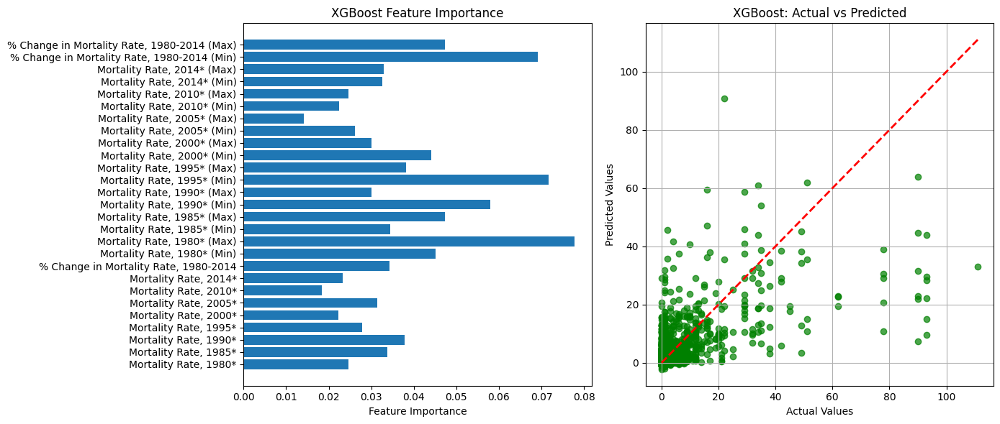

In [ ]:
# To improve perfomance, I drastically increased number of estimators and moderately decreased learning rate
# I also increased decision tree depth to 8, and set alpha to 0.01 to mitigate overfitting via lasso regularization

# --- Define features and target ---
features = [
    'Mortality Rate, 1980*', 'Mortality Rate, 1985*', 'Mortality Rate, 1990*',
    'Mortality Rate, 1995*', 'Mortality Rate, 2000*', 'Mortality Rate, 2005*',
    'Mortality Rate, 2010*', 'Mortality Rate, 2014*', '% Change in Mortality Rate, 1980-2014',
    'Mortality Rate, 1980* (Min)', 'Mortality Rate, 1980* (Max)',
    'Mortality Rate, 1985* (Min)', 'Mortality Rate, 1985* (Max)',
    'Mortality Rate, 1990* (Min)', 'Mortality Rate, 1990* (Max)',
    'Mortality Rate, 1995* (Min)', 'Mortality Rate, 1995* (Max)',
    'Mortality Rate, 2000* (Min)', 'Mortality Rate, 2000* (Max)',
    'Mortality Rate, 2005* (Min)', 'Mortality Rate, 2005* (Max)',
    'Mortality Rate, 2010* (Min)', 'Mortality Rate, 2010* (Max)',
    'Mortality Rate, 2014* (Min)', 'Mortality Rate, 2014* (Max)',
    '% Change in Mortality Rate, 1980-2014 (Min)', '% Change in Mortality Rate, 1980-2014 (Max)'
]

target = 'Number of Sites in 2014'  # the target column

# define the feature matrix and target vector
X = final_sum_df[features]
y = final_sum_df[target]

# scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# XGBoost Regressor
xgb_model = XGBRegressor(n_estimators=500, random_state=42, objective='reg:squarederror', learning_rate = 0.25, depth = 8, alpha = 0.01)
xgb_model.fit(X_train, y_train)

# make predictions and evaluate performance
xgb_preds = xgb_model.predict(X_test)
xgb_mse = mean_squared_error(y_test, xgb_preds)
xgb_r2 = r2_score(y_test, xgb_preds)
xgb_mae = mean_absolute_error(y_test, xgb_preds)

print("XGBoost Regressor Performance:")
print(f"Mean Squared Error: {xgb_mse}")
print(f"R-squared: {xgb_r2}")
print(f"MAE: {xgb_mae}")

# visualize Feature Importance and Actual vs Predicted
plt.figure(figsize=(14, 6))

# Plot Feature Importance for XGBoost
importances = xgb_model.feature_importances_
plt.subplot(1, 2, 1)
plt.barh(features, importances)
plt.xlabel('Feature Importance')
plt.title('XGBoost Feature Importance')

# Plot Actual vs Predicted for XGBoost
plt.subplot(1, 2, 2)
plt.scatter(y_test, xgb_preds, alpha=0.7, color='green')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)  # Perfect prediction line
plt.title("XGBoost: Actual vs Predicted")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.grid(True)

# Show the plots
plt.tight_layout()
plt.show()